In [1]:
clear all

In [2]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy import io
import scipy.io as sio
%matplotlib inline 
import pylab
import csv
from Tkinter import Tk
from tkFileDialog import askopenfilename
from tkFileDialog import askdirectory
import nibabel as nb
from scipy import io
import nibabel as nb
from scipy.interpolate import interp1d
from scipy import ndimage

In [3]:
from sklearn import linear_model

# Open data

In [4]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/media/sophie/b8465819-f4b4-489a-80f2-dbd85351bec1/THDDCGCaMP6/100404series/100405seriesint252Smith0_4_60TS.mat


In [7]:
Ua=sio.loadmat(filename)
DT=Ua['TSo']
DT.shape

(24112, 252)

In [180]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/media/DataPaper/100142/100142ss2oncregcdFF20skf109Smith0_4_60TSzmapint.mat


In [181]:
Ua=sio.loadmat(filename)
DTzmap=Ua['TS2']
DT.shape

(12436, 109)

In [6]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename2 = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename2)

/media/DataPaper/100142/100142ss2oncregcdFF20skf109Smith0_4_60IC.nii


In [7]:
img1 = nb.load(filename2)
data = img1.get_data()

(155, 102, 29, 109)

In [158]:
S=data.shape
S

(155, 102, 29, 109)

In [37]:
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/media/DataPaper/100142/Behavior/controld_2016-05-20-122814-0000TimeFluoOn.mat


In [42]:
Ua=sio.loadmat(filename)

In [45]:
Time=Ua['TimeFluoOnVid']

In [49]:
Time.shape

(12447, 1)

In [51]:
Time_fluoICA=Time[5:12441]
Time_fluoICA.shape

(12436, 1)

In [356]:
np.max(Time_fluoICA)

125.86578452594914

Z-score

In [190]:
Demean=np.zeros(S)
Dmaps=np.zeros(S)
Dvar=np.zeros(S)
Var=np.zeros(S[3])
D2=np.zeros([S[0],S[1],5,S[3]])
Tvar=np.zeros(S[3])

In [191]:
for i in range(S[3]):
    Demean[:,:,:,i]=data[:,:,:,i]-np.mean(np.mean(np.mean(data[:,:,:,i],0),0),0)

In [192]:
for i in range(S[3]):
    Dsq=np.reshape(Demean[:,:,:,i],S[0]*S[1]*S[2])
    Var[i]=np.sqrt(np.var(Dsq))
    Dvar=Demean[:,:,:,i]/Var[i]
    Dmaps[:,:,:,i]=Dvar-2.5
    Tvar[i]=np.var(DT[i,:])
Dmaps[Dmaps<0]=0

In [97]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/media/DataPaper/100142/Behavior/100142Xk.mat


In [98]:
Ua=sio.loadmat(filename)

In [99]:
Xk=Ua['Xk']

# Open Masks

In [25]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from Tkinter import Tk
from tkFileDialog import askopenfilename

Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filenameM = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filenameM)
img1 = nb.load(filenameM)
Masks = img1.get_data()
Sm=Masks.shape
Masks=np.array(Masks)

/media/DataPaper/100142/Registration/JFRC100142Transformedseparate.nii


In [26]:
filenameM='/home/sophie/Downloads/RegionList'
with open(filenameM) as f:
    content = f.readlines()
Names=[Line.split('\t') for Line in content]
RegionName=[Names[i][0] for i in range(75)]
Num=[int(Names[i][2]) for i in range(75)]

# Average in masks to sort components by brain region

In [193]:
Dmaps.shape

(155, 102, 29, 109)

In [194]:
M=np.zeros((S[3],86))
Mapmean=np.zeros(S[3])
MMasks=np.zeros(86)

In [216]:
for i in range(S[3]):
    Mapmean[i]=np.mean(np.mean(np.mean(Dmaps[:,:,:,i])))
    for j in range(86):
        MMasks[j]=np.mean(np.mean(np.mean(Masks[:,:,:,j])))
        if MMasks[j]:
            #M[i,j]=np.mean(np.mean(np.mean(Masks[:,:,:,j]*Dmaps[:,:,:,i])))/(MMasks[j]*Mapmean[i])
            M[i,j]=np.mean(np.mean(np.mean(Masks[:,:,:,j]*Dmaps[:,:,:,i])))/(Mapmean[i])

In [217]:
CompMainName=S[3]*['']
CompNameAdd=np.zeros((S[3],86))
for i in range(S[3]):
    Max=np.max(M[i,:])
    I=np.argmax(M[i,:])+1
    for j in range(86):
        J=[l for l in range(74) if Num[l]==(j+1)]
        if M[i,j]>0.2*Max:
            CompNameAdd[i,J]=1
    J=[l for l in range(75) if Num[l]==I]
    CompMainName[i]=Names[np.array(J)][0]

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:11: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future


In [197]:
Time_fluoICA.shape

(12436, 1)

In [83]:
Time_fluoICA=Time_fluoICA.T

In [84]:
Time_fluoICA.shape

(12436, 1)

In [95]:
Xk=Xk.T

In [96]:
Xk.shape

(3, 12437)

LO_R
LOP_R
11
lobula


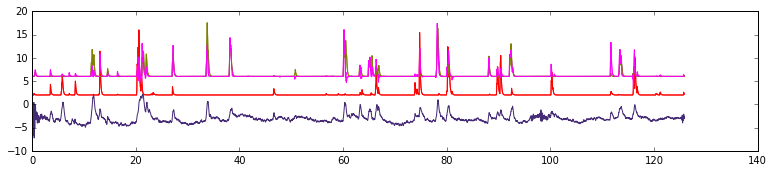

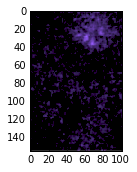

PB
ATL_R
ATL_L
IPS_L
21
protocerebral bridge


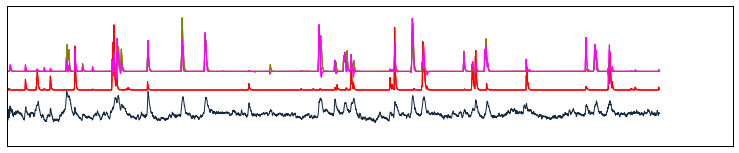

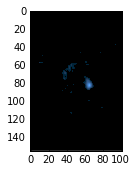

LH_R
SMP_R
AVLP_R
GNG
13
lateral horn


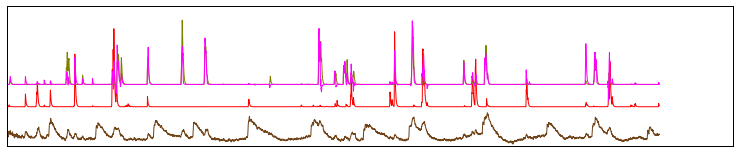

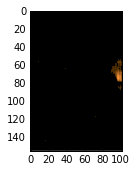

PB
ICL_R
85
inferior clamp


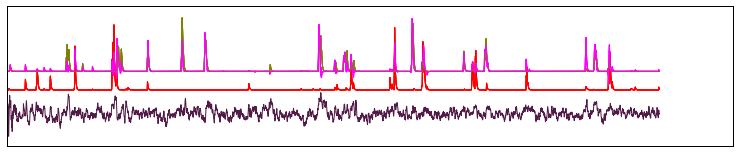

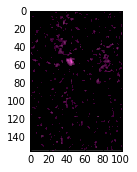

IB_R
SPS_R
IB_L
SPS_L
51
PB
IB_R
62
inferior bridge


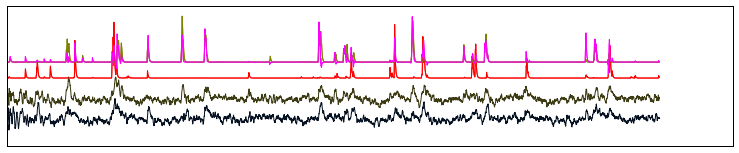

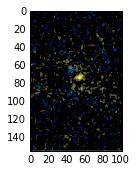

PB
ATL_R
SMP_R
56
antler


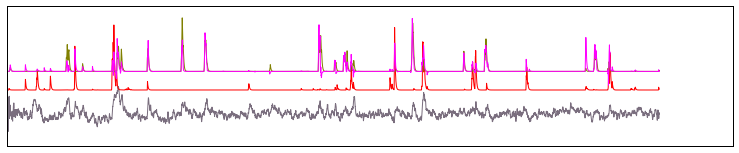

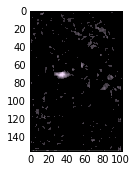

CRE_R
SIP_R
SMP_R
57
crepine


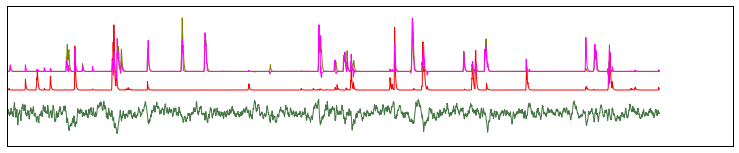

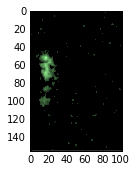

MB_VL_R
SIP_R
MB_VL_L
SIP_L
26
MB_VL_R
SIP_R
MB_VL_L
SIP_L
33
MB_VL_R
SMP_R
MB_VL_L
35
vertical lobe of adult mushroom body


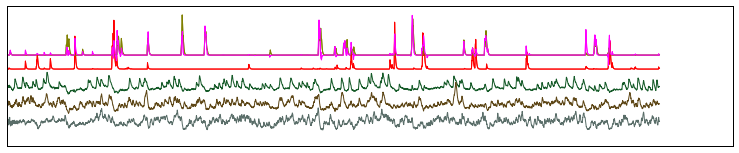

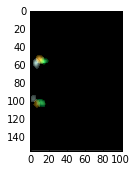

CRE_R
MB_ML_R
SMP_R
MB_ML_L
60
medial lobe of adult mushroom body


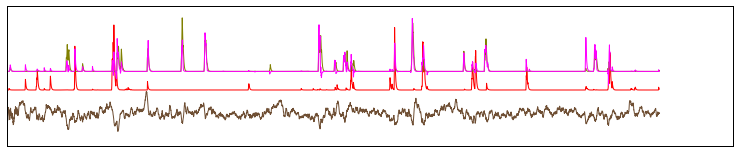

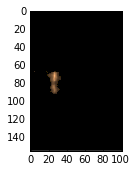

EB
FB
SMP_R
7
ellipsoid body


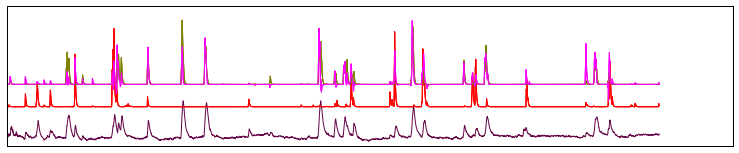

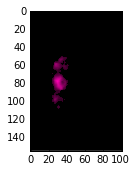

LOP_R
ME_R
LOP_L
34
medulla


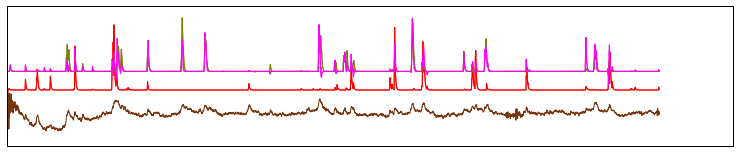

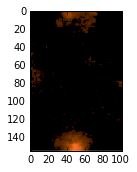

FB
14
FB
28
fan-shaped body


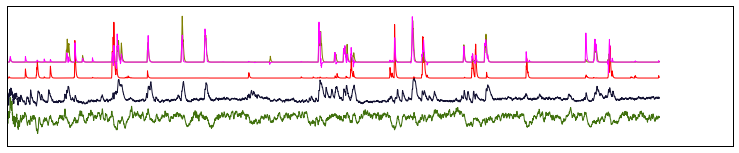

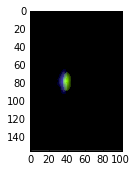

SLP_R
SCL_R
25
superior lateral protocerebrum


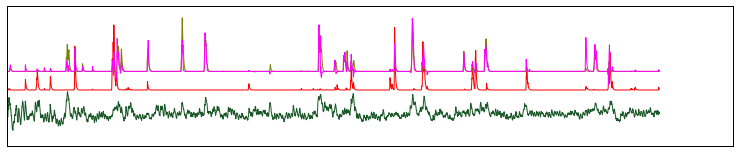

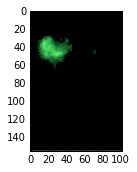

SMP_R
15
SMP_R
19
SMP_R
SMP_L
20
ATL_R
SMP_R
MB_CA_R
SCL_R
30
LO_R
LOP_R
SLP_R
SMP_R
79
SMP_R
SMP_L
100
superior medial protocerebrum


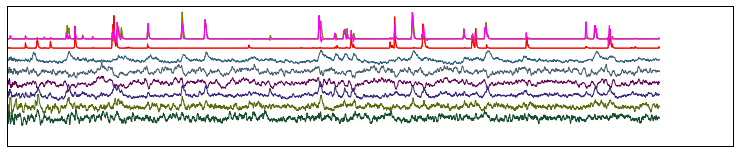

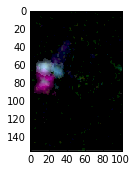

LO_R
PLP_R
SPS_R
1
IB_R
PLP_R
4
LO_R
PLP_R
61
posterior lateral protocerebrum


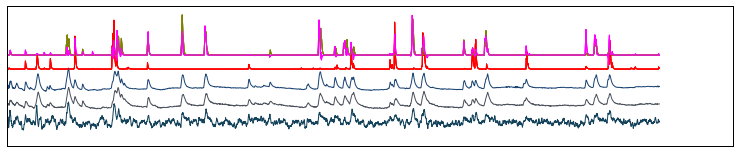

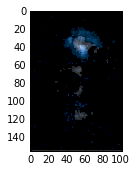

ICL_R
PLP_R
MB_CA_R
10
LH_R
ICL_R
MB_CA_R
SCL_R
23
MB_CA_R
SPS_R
ICL_L
IB_L
32
calyx of adult mushroom body


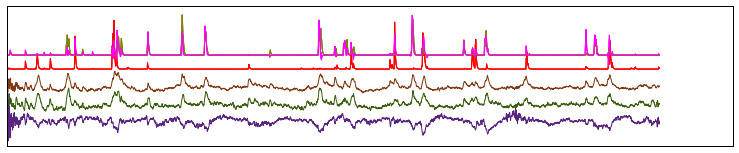

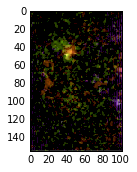

SPS_R
17
MB_CA_R
SPS_R
IPS_R
GNG
27
SPS_R
40
SPS_R
45
superior posterior slope


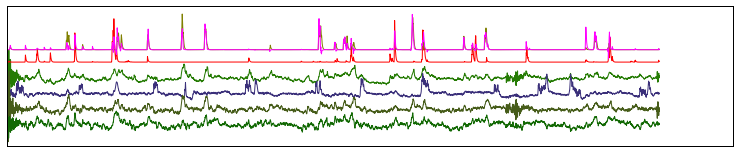

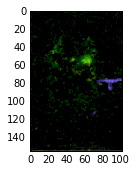

IPS_R
41
inferior posterior slope


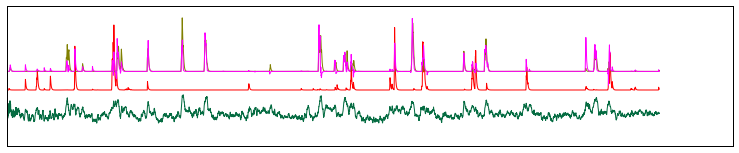

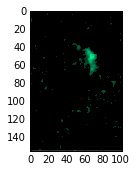

GNG
12
GNG
47
GNG
53
GNG
58
GNG
IB_L
64
GNG
66
IPS_R
GNG
78
adult gnathal ganglion


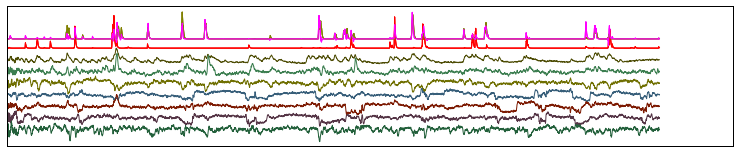

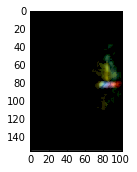

LO_L
LOP_L
0
lobula


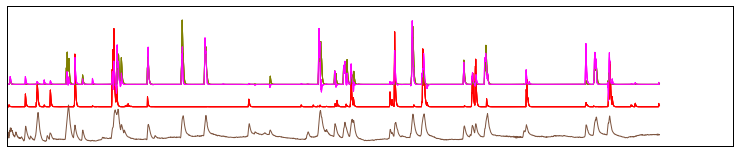

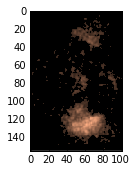

IB_L
54
PB
IB_L
ATL_L
74
inferior bridge


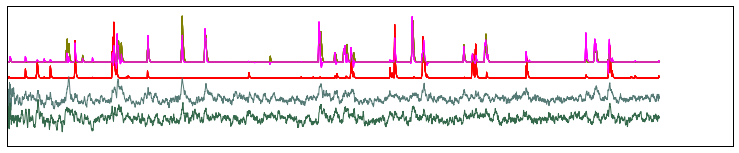

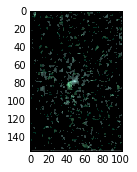

MB_VL_L
SIP_L
104
vertical lobe of adult mushroom body


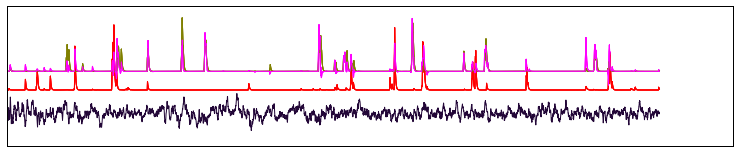

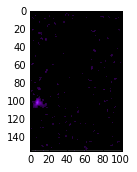

ICL_R
ME_R
LOP_L
ME_L
59
medulla


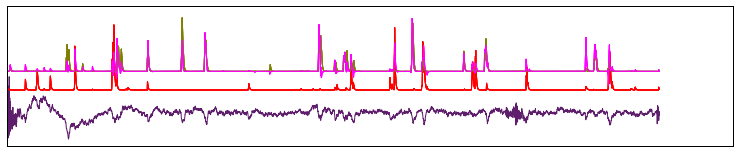

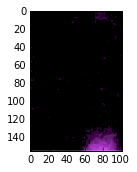

SLP_L
SMP_L
MB_CA_L
18
SLP_L
65
superior lateral protocerebrum


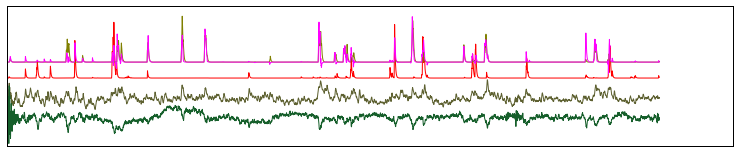

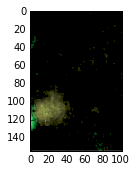

ATL_L
SMP_L
24
SMP_L
29
SMP_L
39
SMP_R
SMP_L
89
superior medial protocerebrum


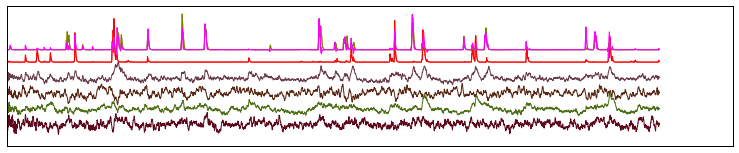

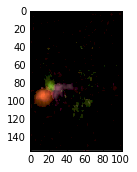

IB_R
IB_L
SPS_L
5
SPS_L
52
IB_L
SPS_L
99
superior posterior slope


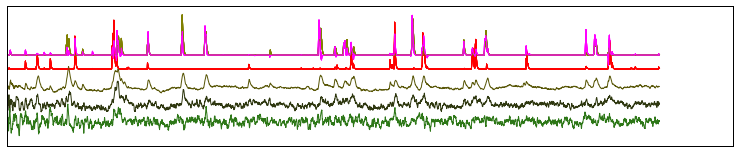

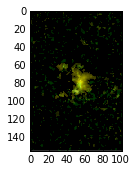

MB_PED_R
SCL_R
SCL_L
42
superior clamp


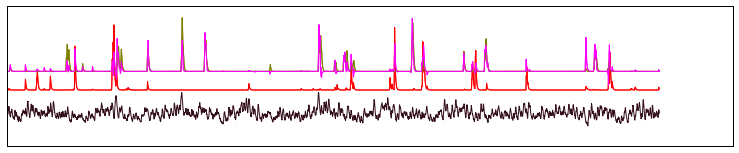

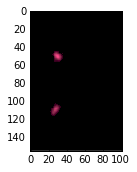

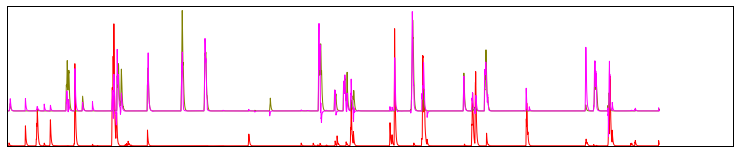

In [220]:
pylab.rcParams['figure.figsize'] = (13, 2.5)

h=5
tot=0
GoodICAnat=np.zeros(S[3])

for l in range(74):
    Final_maps=np.zeros((S[0],S[1],3))
    Fmap=np.zeros((S[0],S[1],3))
    C=np.zeros(3)

    n=0
    for i in range(len(CompMainName)):                    
        Dmmv=np.mean(data[:,:,:,i],2) 
        Dmmv[Dmmv<0.2*np.max(np.max(np.max(Dmmv)))]=0
        C=np.squeeze(np.random.rand(3,1))
        labeled, nrobject=ndimage.label(Dmmv>0)
        
        if CompMainName[i]==Names[l][0] and (sum(CompNameAdd[i,:])<5) and nrobject<400:
            n=n+1            
            
            for k in range(3):
                Fmap[:,:,k]=0.7*Dmmv*C[k]/np.max(C)
            Final_maps=Final_maps+Fmap
            plt.plot(Time_fluoICA,(DT[:,i]/np.sqrt(np.var(DT[:,i]))-h*n+2),color=C/2)        
            tot=tot+1
            GoodICAnat[i]=1
            #print(i)
            for j in range(86):
                if CompNameAdd[i,j]==1:                
                    print(Names[np.array(j)][0])
            print(i)
            
    plt.plot(Time_fluoICA,Xk[:,0]/np.std(Xk[:,0])+2,color=(1,0,0))   
    plt.plot(Time_fluoICA,Xk[:,1]/np.std(Xk[:,1])+6,color=(0.5,0.5,0))
    plt.plot(Time_fluoICA,Xk[:,2]/np.std(Xk[:,2])+6,color=(1,0,1))

    #plt.plot(Time_fluoICA.T,2*Xk[:,2]/np.max(Xk[:,2])+1.5,color=(1,0,1))    
    if n!=0:
        print(Names[l][1])

        plt.show()
        FM=Final_maps/np.max(np.max(Final_maps))
        FM[FM<0.1]=0
        plt.imshow(FM,interpolation='none')
        plt.show()
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)

In [103]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from Tkinter import Tk
from tkFileDialog import askopenfilename

Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filenamet = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filenamet)
nimt=nb.load(filenamet)
Dtemp=np.squeeze(nimt.get_data())
Dtemp.shape

/media/DataPaper/100142/100142GreyTemplate.nii


(155, 102, 29)

# Reorder by larger sub-regions (~ presumed stimulus to motor)

In [104]:
LargerRegionsDic={'':'','AME_R':'OL','LO_R':'OL','NO':'CX','BU_R':'CX','PB':'CX','LH_R':'LH','LAL_R':'LX','SAD':'PENP'
               ,'CAN_R':'PENP','AMMC_R':'PENP','ICL_R':'INP','VES_R':'VMNP','IB_R':'INP','ATL_R':'INP','CRE_R':'INP'
               ,'MB_PED_R':'MB','MB_VL_R':'MB','MB_ML_R':'MB','FLA_R':'PENP','LOP_R':'OL','EB':'CX','AL_R':'AL',
                'ME_R':'OL','FB':'CX','SLP_R':'SNP','SIP_R':'SNP','SMP_R':'SNP','AVLP_R':'VLNP','PVLP_R':'VLNP',
                'IVLP_R':'VLNP','PLP_R':'VLNP','AOTU_R':'VLNP','GOR_R':'VMNP','MB_CA_R':'MB','SPS_R':'VMNP',
                'IPS_R':'VMNP','SCL_R':'INP','EPA_R':'VMNP','GNG':'GNG','PRW':'PENP','GA_R':'LX','AME_L':'OL'
                ,'LO_L':'OL','BU_L':'CX','LH_L':'LH','LAL_L':'LX','CAN_L':'PENP','AMMC_L':'PENP','ICL_L':'INP',
                'VES_L':'VMNP','IB_L':'INP','ATL_L':'INP','CRE_L':'INP','MB_PED_L':'MB','MB_VL_L':'MB',
                'MB_ML_L':'MB','FLA_L':'PENP','LOP_L':'OL','AL_L':'AL','ME_L':'OL','SLP_L':'SNP','SIP_L':'SNP',
                'SMP_L':'SNP','AVLP_L':'VLNP','PVLP_L':'VLNP','IVLP_L':'VLNP','PLP_L':'VLNP','AOTU_L':'VLNP',
                'GOR_L':'VMNP','MB_CA_L':'MB','SPS_L':'VMNP','IPS_L':'VMNP','SCL_L':'INP','EPA_L':'VMNP','GA_L':'LX'}

In [105]:
SmallRegionsSorted=['ME_L','ME_R','LO_R','LO_L','LOP_R','LOP_L','AME_R','AME_L',
                  'PLP_R','PLP_L','PVLP_R','PVLP_L','AVLP_R','AVLP_L','AOTU_R','AOTU_L','IVLP_R','IVLP_L',
                  'AL_R','AL_L',
                  'MB_CA_R','MB_CA_L','MB_PED_R','MB_PED_L','MB_VL_R','MB_VL_L','MB_ML_R','MB_ML_L',
                  'SMP_R','SMP_L','SIP_R','SLP_L','SLP_R','SIP_L',
                  'LH_R','LH_L',                  
                  'CRE_R','CRE_L','ICL_R','ICL_L','SCL_R','SCL_L','IB_R','IB_L','ATL_R','ATL_L',
                  'EB','PB','NO','FB',
                  'BU_R','BU_L','LAL_R','LAL_L','GA_R','GA_L',
                  'GOR_R','GOR_L','EPA_R','EPA_L','VES_R','VES_L','SPS_R','SPS_L','IPS_R','IPS_L',
                  'AMMC_R','AMMC_L','SAD','FLA_R','FLA_L','PRW','CAN_R','CAN_L',
                  'GNG','']

In [106]:
Tozip=range(len(SmallRegionsSorted))
SmallRegionsDic=dict(zip(SmallRegionsSorted,Tozip))

In [107]:
LargerRegionInd={ 'OL':1,'VLNP':2,'VMNP':3,'AL':4,'MB':5,'LH':6,'SNP':7,'CX':8,'LX':9,'INP':10,'PENP':11,'GNG':12,'':13}

In [199]:
LargerRegion=[LargerRegionsDic[CompMainName[i]] for i in range(S[3])]

In [200]:
LargerRegionI=np.array([LargerRegionInd[LargerRegion[i]] for i in range(S[3])])

In [201]:
SmallRegion=np.array([SmallRegionsDic[CompMainName[i]] for i in range(S[3])])

In [202]:
NewOrder=np.argsort(SmallRegion)

# Import VFB database

In [150]:
from rpy2 import robjects

In [206]:
robjects.r['load']('/home/sophie/JefferisData.Rdata')
JefferisData=robjects.r['x']
e=np.array(JefferisData)
enorm=e[10:85,:].astype(float)
for i in range(75):
    enorm[i,:]=np.divide(enorm[i,:],np.max(enorm[i,:]))
#enorm[enorm<0.1]=0

In [166]:
set(e[4,:])

{'5-HT1B-Gal4',
 'Cha-Gal4',
 'G0239-Gal4',
 'GH146-Gal4',
 'Gad1-Gal4',
 'TH-Gal4',
 'Tdc2-Gal4',
 'Trh-Gal4',
 'VGlut-Gal4',
 'fru-Gal4',
 'npf-GAL4'}

In [221]:
S2=M.shape
M2=np.zeros((S2[0],75))
for j in range(86):
    J=np.array([l for l in range(75) if Num[l]==j+1])
    if J.shape[0] != 0:
        J=J[0]
        M2[:,J]=M[:,j]
Mnorm=M2
for i in range(75):
    Mnorm[j,i]=M2[j,i]/np.max(M2[:,i])
#Mnorm[Mnorm<0.1]=0

In [222]:
Scores=np.zeros((enorm.shape[1],M2.shape[0]))
for i in range(enorm.shape[1]):
    for j in range(M2.shape[0]):
        #Scores[i,j]=np
        #Scores[i,j]=np.inner(enorm[:,i],Mnorm[j,:])
        Scores[i,j]=sum((enorm[:,i]*Mnorm[j,:]))
        #Scores[i,j]=-sum(abs(enorm[:,i]-Mnorm[j,:]))        

In [223]:
ScoresTH=np.zeros((enorm.shape[1],M2.shape[0]))-18
for i in range(enorm.shape[1]):
    for j in range(M2.shape[0]):
        if e[4,i]=='TH-Gal4':
            ScoresTH[i,j]=np.inner(enorm[:,i],Mnorm[j,:])
            #ScoresTH[i,j]=-sum(abs(enorm[:,i]-Mnorm[j,:]))

In [156]:
import csv
i=0
NeuronName=[]
with open('/home/sophie/fc_name_mapping.csv') as f:
    file_read = csv.reader(f)
    for row in file_read:
        NeuronName.append(row[3])
        i=i+1

# Last pruning by hand

In [112]:
%%javascript
IPython.OutputArea.auto_scroll_threshold =4000;

<IPython.core.display.Javascript object>

In [113]:
if S[2]>5:
    Nstack=5
    Int100=[(i+1)*100/Nstack for i in range(Nstack)]
    Percs=np.percentile(range(S[2]),Int100)
    Indices=np.split(range(S[2]),Percs)
    D1=np.zeros([S[0],S[1],Nstack])
    Dmean=np.squeeze(data[:,:,range(Nstack),2])
    for i in range(Nstack):
        Vmean=np.mean(Dtemp[:,:,Indices[i]],2)
        Dmean[:,:,i]=Vmean
else:
    Nstack=S[2]
    D1=np.zeros([S[0],S[1],S[2]])
    Dmean=data[:,:,range(S[2])]  
    Dmean=np.squeeze(Dtemp[:,:,:])

/usr/local/lib/python2.7/dist-packages/numpy/lib/shape_base.py:422: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  sub_arys.append(_nx.swapaxes(sary[st:end], axis, 0))


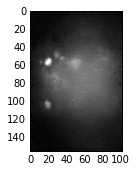

In [114]:
plt.imshow(Dmean[:,:,1],cmap=plt.cm.gray)

In [262]:
my_cmap=plt.cm.jet
my_cmap.set_bad(alpha=0)
Good_ICs=np.zeros(S[3])
Label_ICs=[]
pylab.rcParams['figure.figsize'] = (15, 2.5)

In [116]:
algorithm = linear_model.LinearRegression()

In [117]:
Sxk=Xk.shape

In [132]:
Sxk

(12436, 3)

In [135]:
Xk=Xk.T

In [136]:
X=np.zeros((Sxk[0],3))

In [137]:
X[:,0]=(Xk[:,0]-np.mean(Xk[:,0]))/np.std(Xk[:,0])
X[:,1]=(Xk[:,1]-np.mean(Xk[:,1]))/np.std(Xk[:,1])
X[:,2]=(Xk[:,2]-np.mean(Xk[:,2]))/np.std(Xk[:,2])

In [138]:
X.shape

(12436, 3)

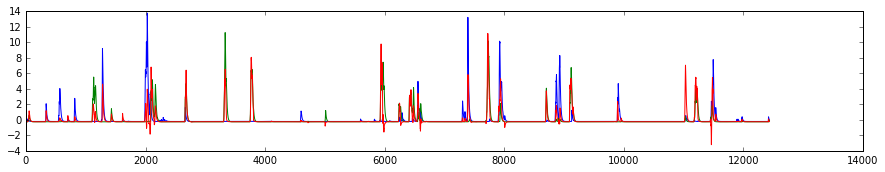

In [140]:
plt.plot(X)

0
LO_L


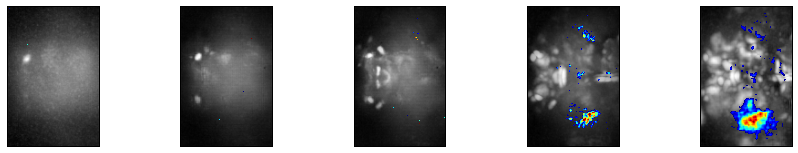

('left:', 0.14145584939829758, 'right:', 0.2267611923702284, 'walk:', -0.037226302105255737)
0.579505907862
VGlut-F-300025
VGlut-F-200253
TH-M-000026
TH-F-200091


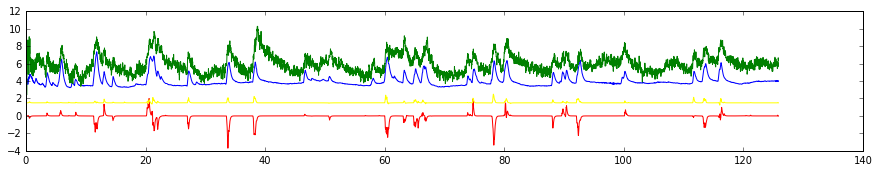

a
1
PLP_R


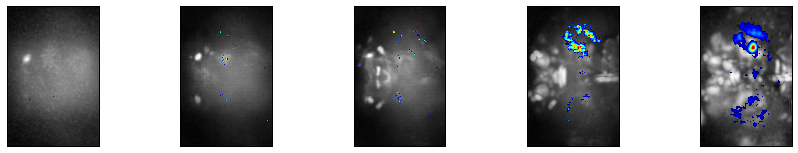

('left:', 0.12467854825246981, 'right:', 0.20051370499986598, 'walk:', -0.024568098395232663)
0.605625336196
TH-F-100105
TH-F-100005
TH-F-100105
TH-F-100005


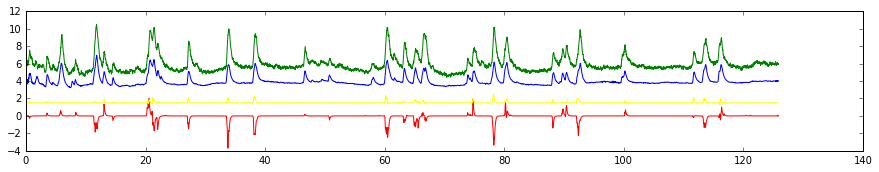

a
2
SPS_L


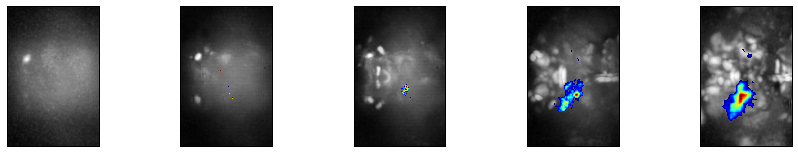

('left:', 0.10918809700766795, 'right:', 0.20055568631407056, 'walk:', -0.035951590452889204)
0.566470110925
TH-F-200020
VGlut-F-900065
TH-F-200020
TH-F-200035


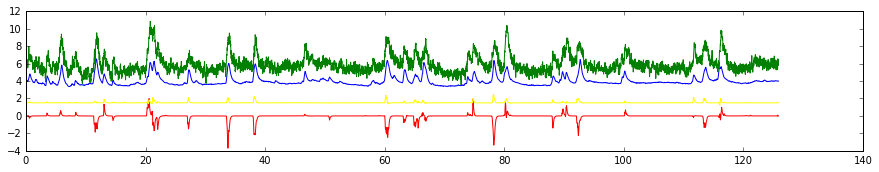

a
3
ICL_R


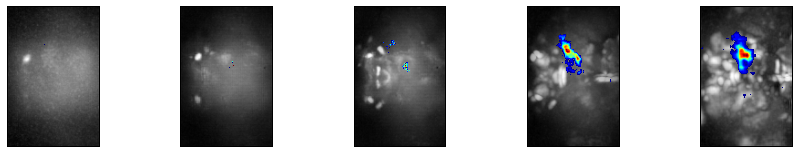

('left:', 0.093235395957892736, 'right:', 0.15237870456205102, 'walk:', -0.023587786953884166)
0.558682638989
TH-F-100005
TH-F-000079
TH-F-100005
TH-F-000079


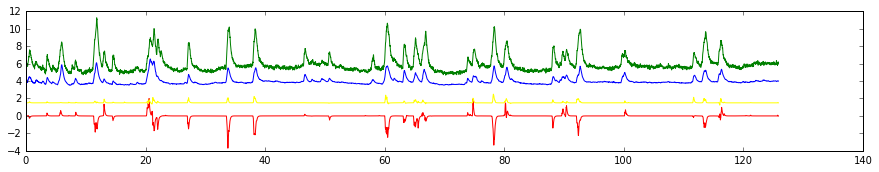

a
4
PLP_R


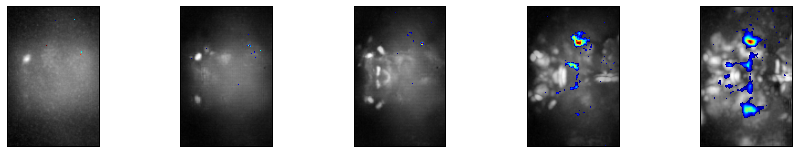

('left:', 0.076980459656314074, 'right:', 0.12996532979935818, 'walk:', -0.030140351537244953)
0.478683715358
TH-F-100105
VGlut-F-100092
TH-F-100105
TH-F-100005


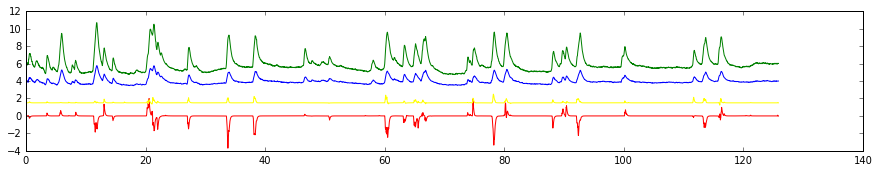

a
5
SPS_L


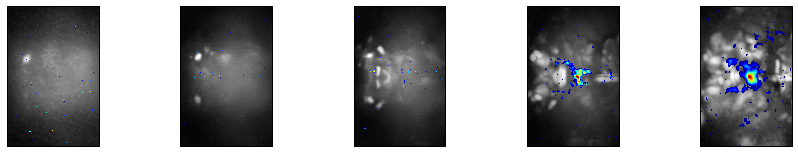

('left:', 0.062325299877754529, 'right:', 0.10321531104635442, 'walk:', -0.031429763204656166)
0.495157134974
VGlut-F-000071
Tdc2-F-000042
TH-F-200020
TH-M-000048


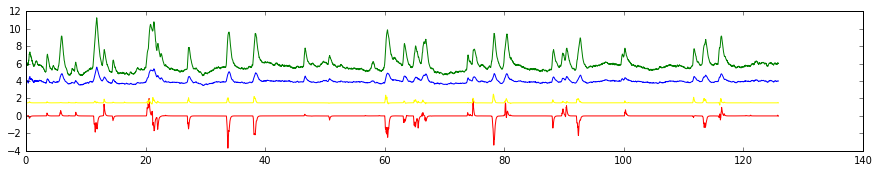

a
6
SPS_L


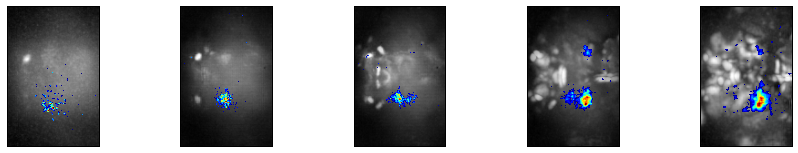

('left:', 0.072557703210111013, 'right:', 0.063825121957588965, 'walk:', -0.00012591838499402541)
0.534708594777
Tdc2-F-000042
5-HT1B-F-100000
TH-F-200020
TH-M-000059


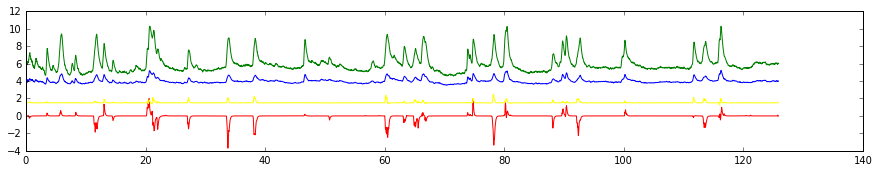

a
7
EB


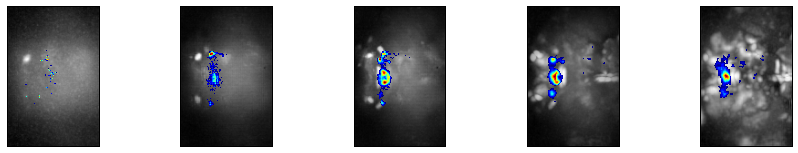

('left:', 0.035547851966583194, 'right:', 0.10654743468168625, 'walk:', -0.034848241640069527)
0.558291624914
VGlut-F-000067
TH-M-100057
TH-M-100057
TH-F-200023


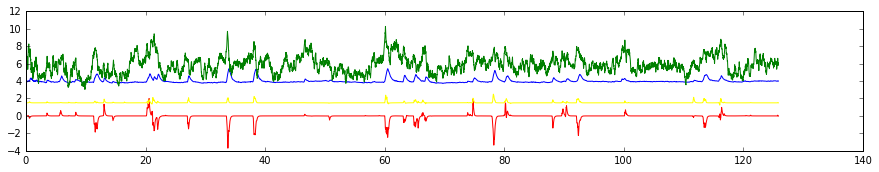

a
8
IPS_R


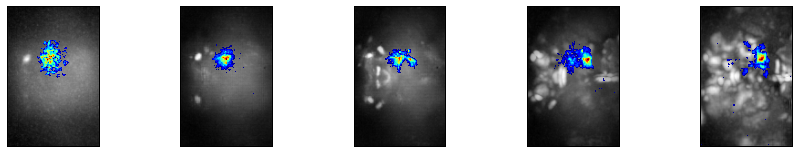

('left:', 0.012883175310958294, 'right:', 0.099349163545217667, 'walk:', -0.016019141178307647)
0.641394608554
TH-F-200057
TH-F-100025
TH-F-200057
TH-F-100025


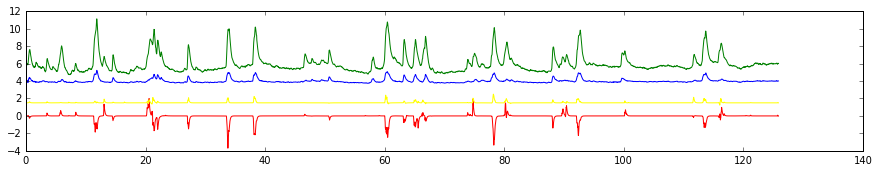

a
9
PLP_R


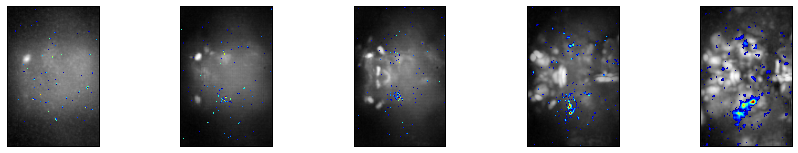

('left:', 0.046815461335452807, 'right:', 0.067788202889146179, 'walk:', -0.0079048203814197707)
0.574604504106
TH-F-100105
VGlut-F-100092
TH-F-100105
TH-F-100005


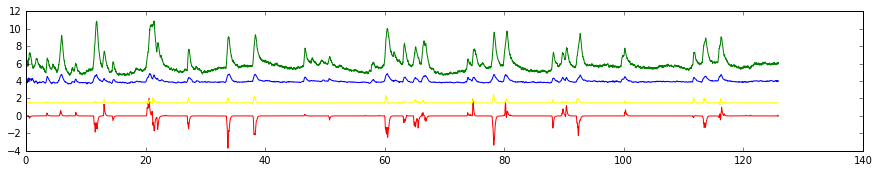

a
10
MB_CA_R


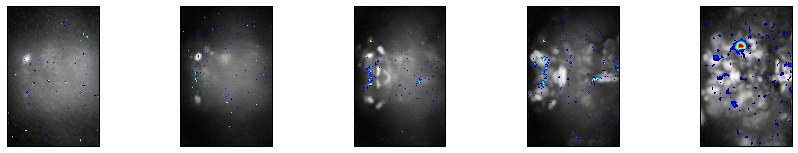

('left:', 0.038263194776897262, 'right:', 0.059594522114957083, 'walk:', -0.010776429004910021)
0.471577590198
VGlut-F-000090
TH-F-300078
TH-F-300078
TH-F-000011


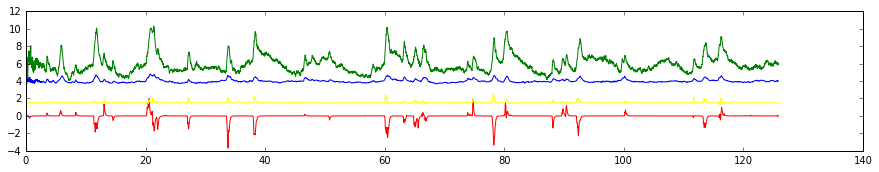

a
11
LO_R


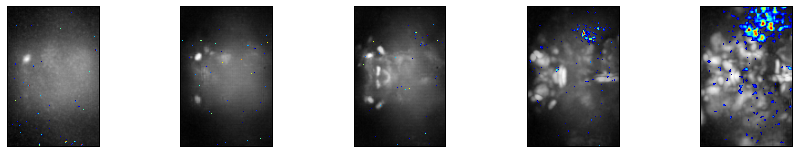

('left:', 0.037046685547761075, 'right:', 0.058245360896103555, 'walk:', -0.010378377959598041)
0.45472590483
VGlut-F-500422
VGlut-F-700175
TH-F-100105
TH-F-300001


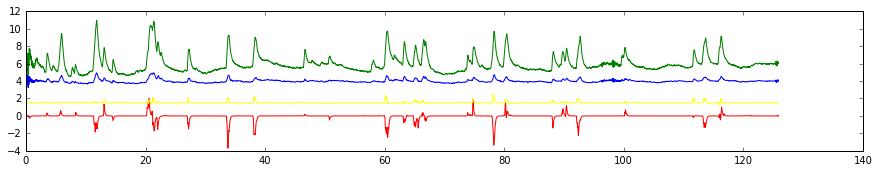


12
GNG


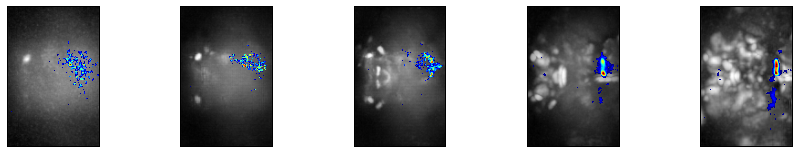

('left:', 0.026573923235838369, 'right:', 0.032020378777245943, 'walk:', -0.0001672368107758504)
0.225594013497
TH-F-000004
TH-M-000007
TH-F-000004
TH-M-000007


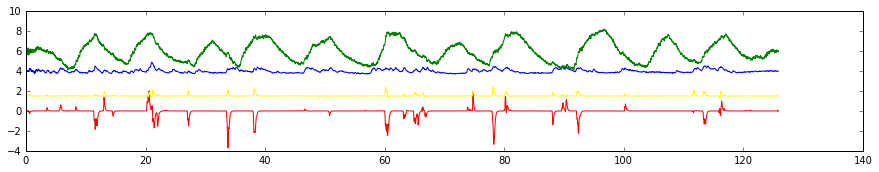


13
LH_R


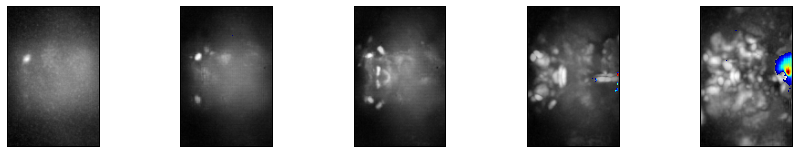

('left:', 0.0102733332047939, 'right:', 0.021146894814310674, 'walk:', 0.004506090264681413)
0.0994799367569
TH-M-000030
TH-F-000012
TH-M-000030
TH-F-000012


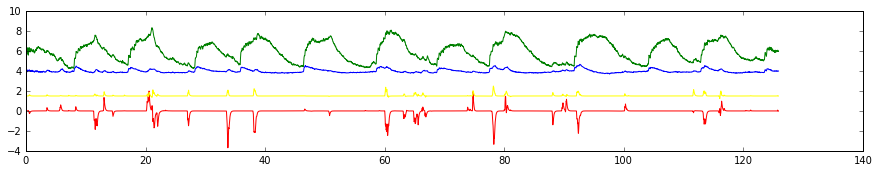


14
FB


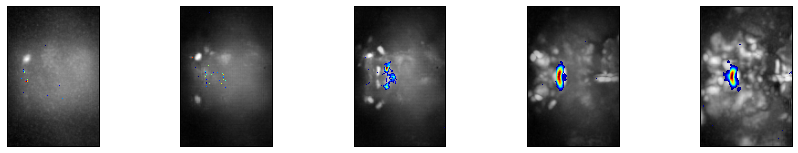

('left:', 0.015308210280404575, 'right:', 0.060328952859677903, 'walk:', -0.020214169964881831)
0.361216703946
VGlut-F-000067
TH-F-300019
TH-F-300019
TH-F-200104


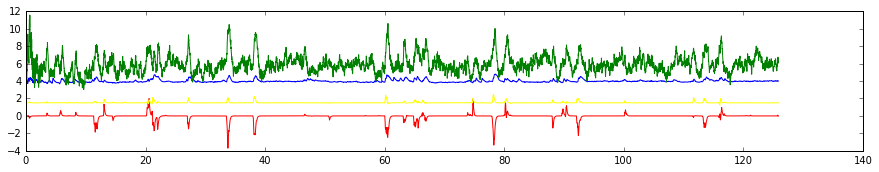

a
15
SMP_R


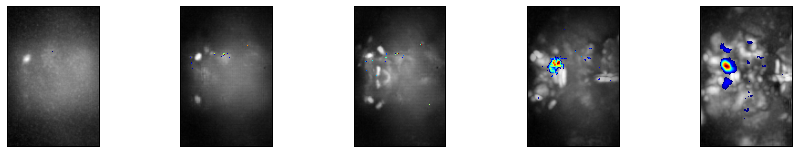

('left:', 0.0091333574162057226, 'right:', 0.052155575554028562, 'walk:', -0.016390722934676569)
0.274609274194
TH-M-000049
TH-F-000019
TH-M-000049
TH-F-000019


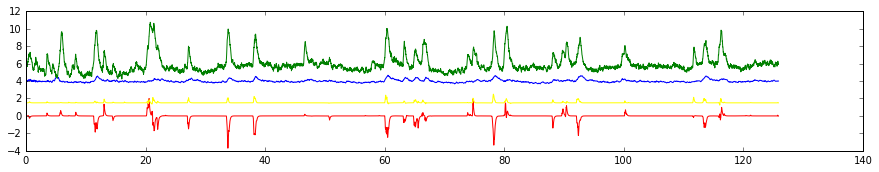

a
16
ME_R


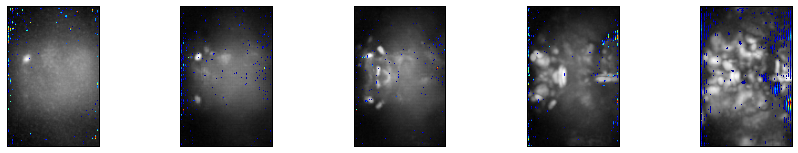

('left:', -0.018561785488801531, 'right:', -0.041839656146663275, 'walk:', 0.0040472364141792144)
0.319778578719
Trh-F-200023
Trh-M-700055
TH-M-000013
TH-F-100055


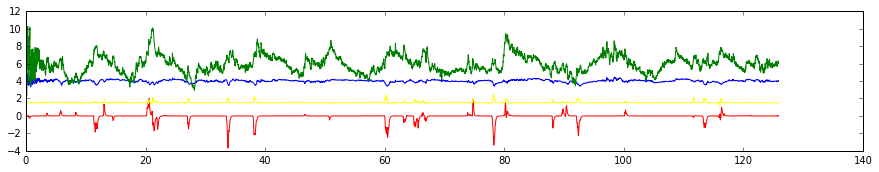


17
SPS_R


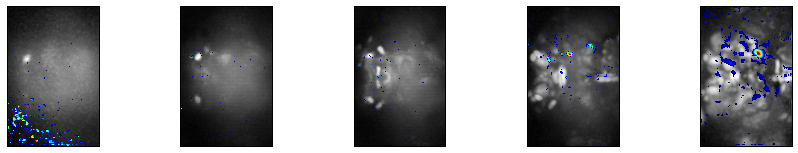

('left:', 0.024891050460981539, 'right:', 0.041130727889803535, 'walk:', -0.014442556734376274)
0.270514325027
Tdc2-F-000027
TH-F-100005
TH-F-100005
TH-F-000079


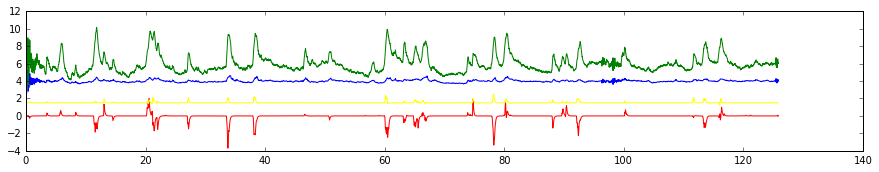


18
SLP_L


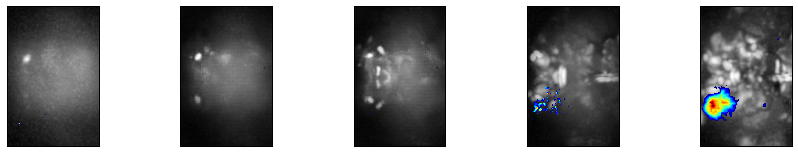

('left:', 0.02123937795346206, 'right:', 0.039476028804232427, 'walk:', -0.0094558690063618715)
0.261875182461
Trh-F-200023
TH-M-000013
TH-M-000013
TH-M-000042


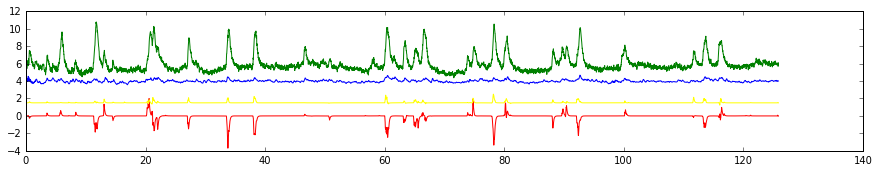

a
19
SMP_R


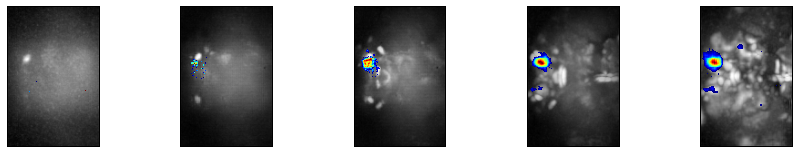

('left:', -0.014548097069899613, 'right:', -0.015035696575804147, 'walk:', 0.0055917381121992973)
0.0567170169817
TH-M-000049
TH-F-000019
TH-M-000049
TH-F-000019


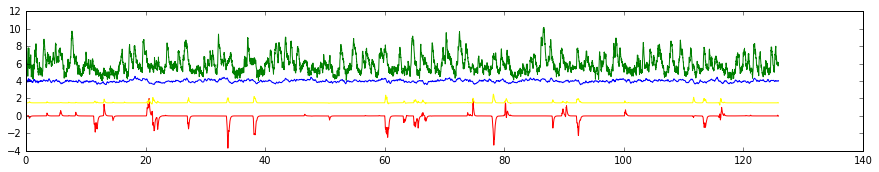

a
20
SMP_R


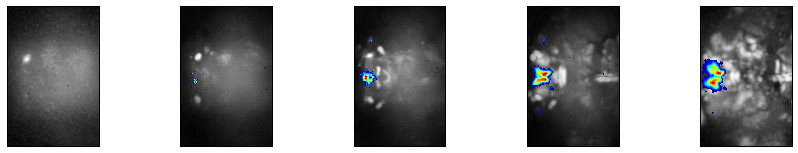

('left:', -0.019087124198869803, 'right:', -0.02192550250375775, 'walk:', 0.0078931927548497541)
0.112548761784
TH-M-000049
TH-F-000053
TH-M-000049
TH-F-000053


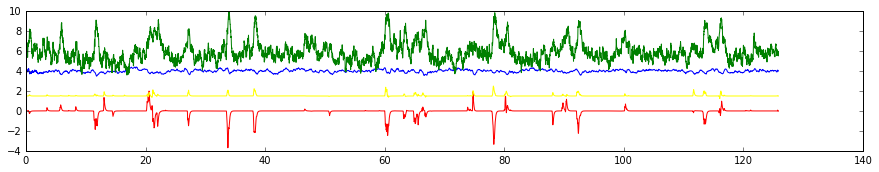

a
21
PB


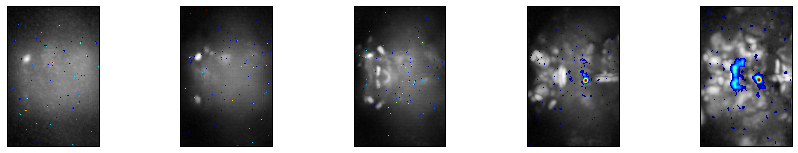

('left:', 0.026733666982227396, 'right:', 0.047345595036705539, 'walk:', -0.0080746703431831476)
0.485711369411
TH-F-000048
TH-M-000034
TH-F-000048
TH-M-000034


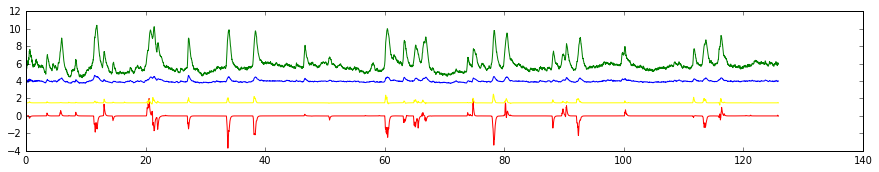

a
22
MB_CA_L


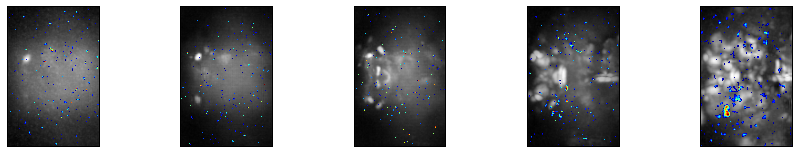

('left:', 0.027432433924641349, 'right:', 0.044849838104858417, 'walk:', -0.0075063362291778457)
0.476253902572
TH-M-000042
TH-M-000013
TH-M-000042
TH-M-000013


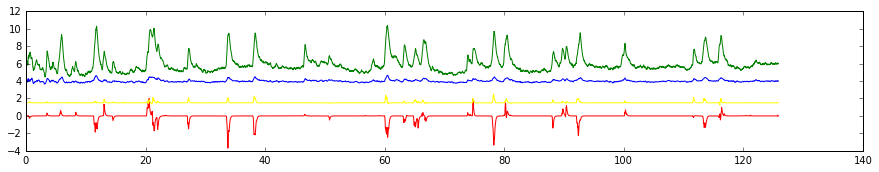


23
MB_CA_R


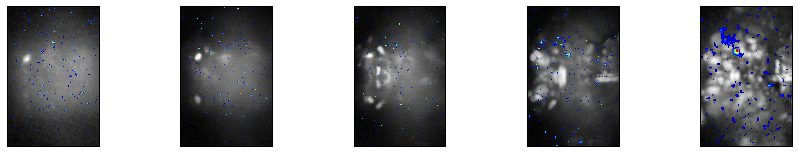

('left:', 0.026350239907248069, 'right:', 0.044555127676200929, 'walk:', -0.0074505072347436294)
0.478844465135
TH-F-000011
TH-F-300078
TH-F-000011
TH-F-300078


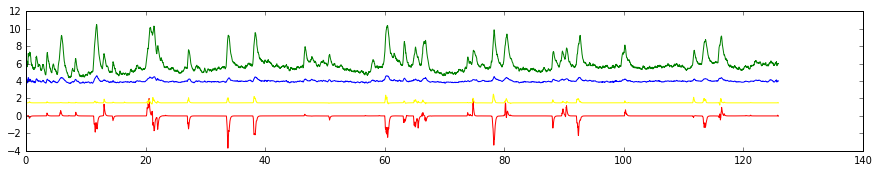

a
24
SMP_L


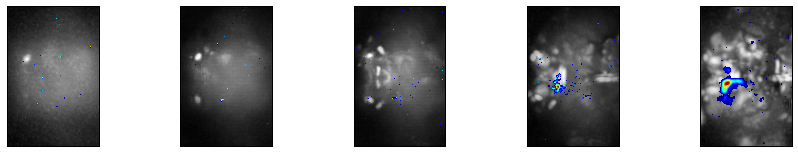

('left:', 0.029350097456434875, 'right:', 0.035320219120624802, 'walk:', -0.011420907944240687)
0.332124637114
TH-F-000053
VGlut-F-000077
TH-F-000053
TH-F-200092


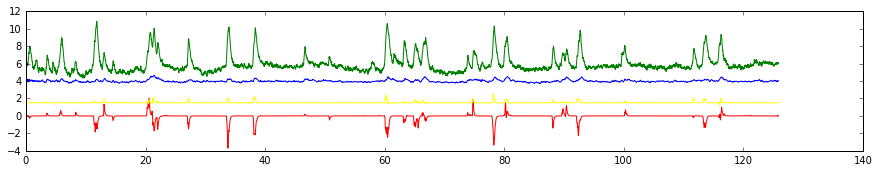

a
25
SLP_R


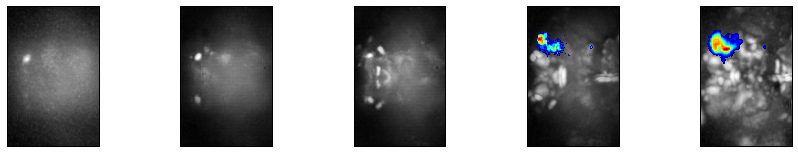

('left:', 0.014070001403959108, 'right:', 0.034960812331806139, 'walk:', -0.0062917482984991453)
0.267834822769
VGlut-F-200143
TH-F-000012
TH-F-000012
TH-M-000030


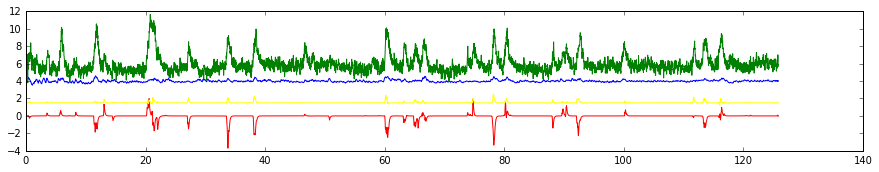

a
26
MB_VL_R


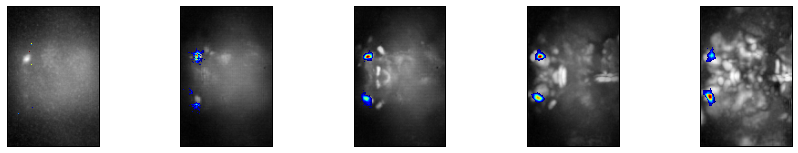

('left:', -0.01267332608176411, 'right:', -0.021144422490621109, 'walk:', 0.0081773860463269718)
0.0893830632779
Trh-M-200082
TH-M-300011
TH-M-300011
TH-M-100075


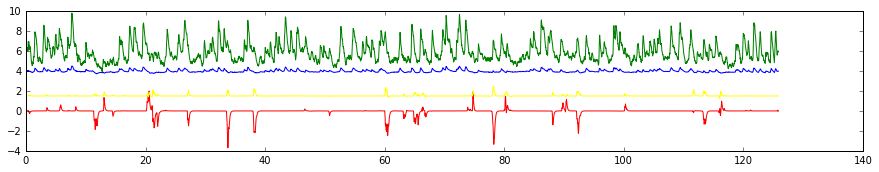

a
27
SPS_R


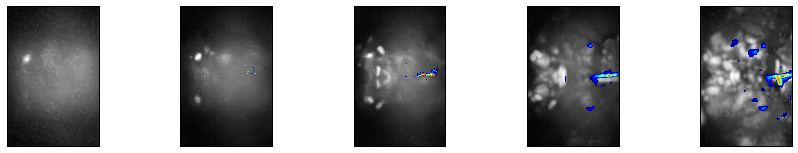

('left:', 0.009952096013413415, 'right:', 1.0706545986882959e-05, 'walk:', 0.0022942572700503545)
0.0306734282315
Tdc2-F-000027
Tdc2-F-000024
TH-F-300072
TH-F-200113


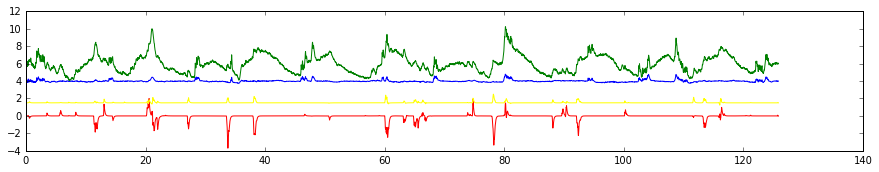


28
FB


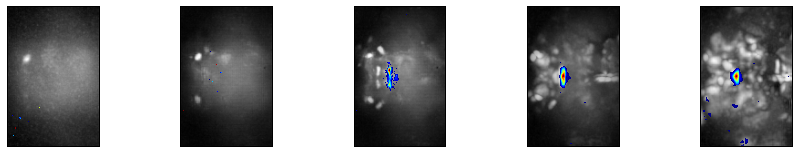

('left:', -0.010448450657673844, 'right:', -0.0024277301506913426, 'walk:', 0.0011806335710514686)
0.0289880917899
VGlut-F-000067
TH-F-300019
TH-F-300019
TH-F-200104


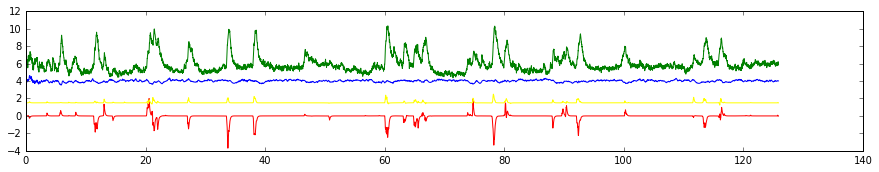

a
29
SMP_L


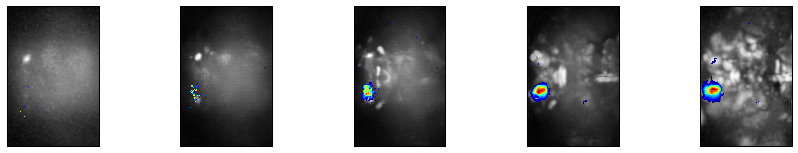

('left:', -0.0091248716116464398, 'right:', -0.011947116357486326, 'walk:', 0.0054992764784551756)
0.0371047111818
TH-F-000053
VGlut-F-000077
TH-F-000053
TH-F-200092


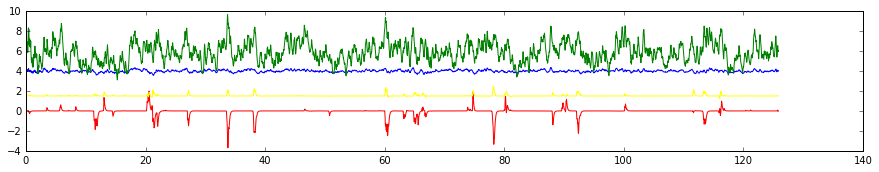

a
30
SMP_R


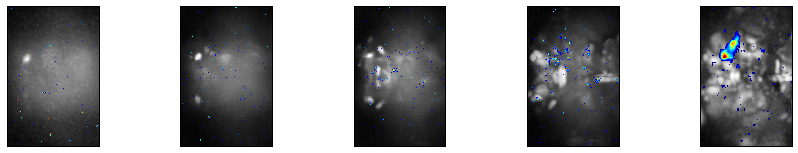

('left:', 0.018342947999551069, 'right:', 0.038898746754291294, 'walk:', -0.0050229572386368479)
0.471591294607
TH-F-000011
TH-F-300078
TH-F-000011
TH-F-300078


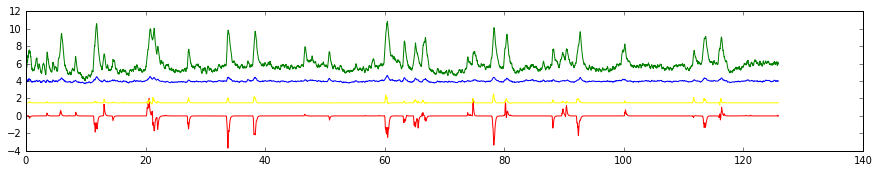

a
31
MB_ML_R


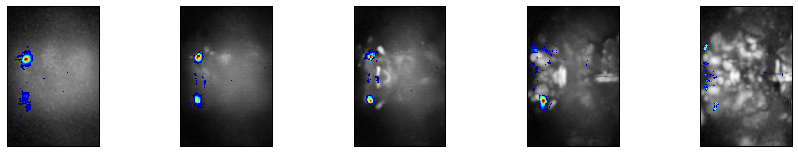

('left:', -0.0053091100958441977, 'right:', -0.0066067268892491867, 'walk:', 0.0047524290307530736)
0.0101372453782
Trh-M-200082
Trh-M-200129
TH-M-100075
TH-M-300055


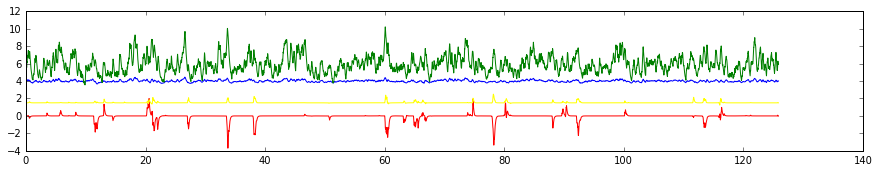

a
32
MB_CA_R


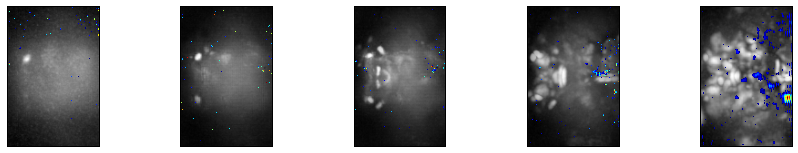

('left:', -0.016182111759239191, 'right:', -0.019390567255699268, 'walk:', 0.00074799081621867297)
0.194127752422
TH-F-300078
VGlut-F-000071
TH-F-300078
TH-M-000048


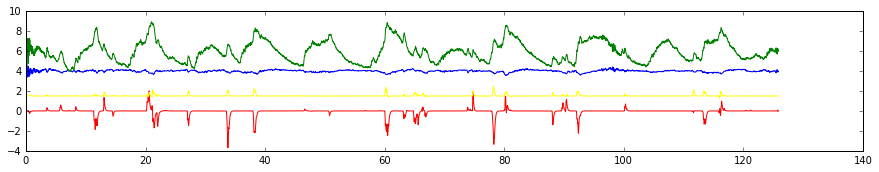


33
MB_VL_R


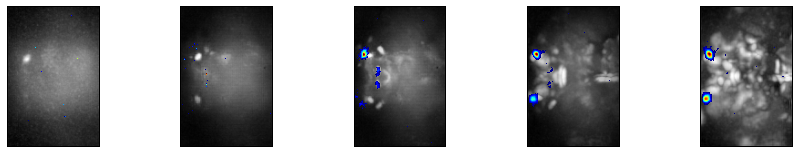

('left:', -0.011246158647319688, 'right:', -0.015916357382230045, 'walk:', 0.0072718103667405512)
0.0664817316951
TH-M-300011
Trh-M-200082
TH-M-300011
TH-F-100099


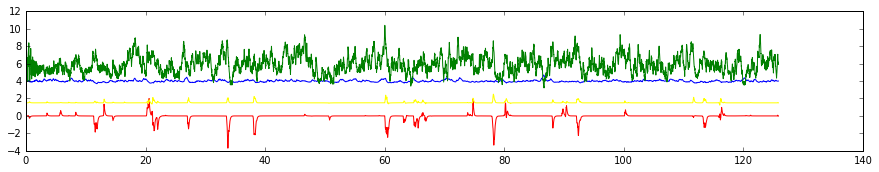

a
34
ME_R


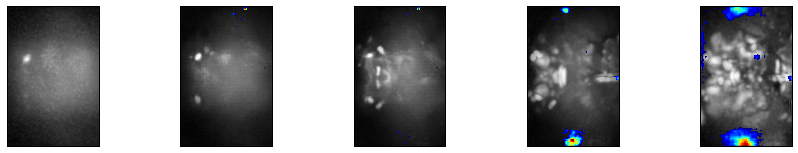

('left:', 0.012262647428246625, 'right:', 0.018378823993068182, 'walk:', 0.0015843551917010847)
0.178328966315
Trh-M-700055
VGlut-F-200173
TH-M-000026
TH-F-100005


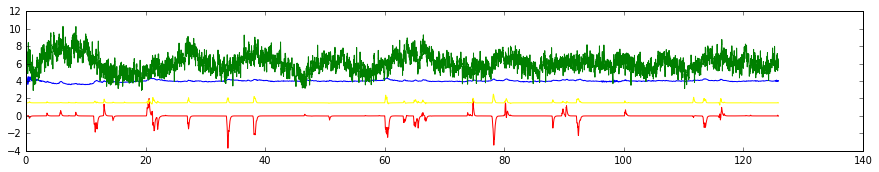


35
MB_VL_R


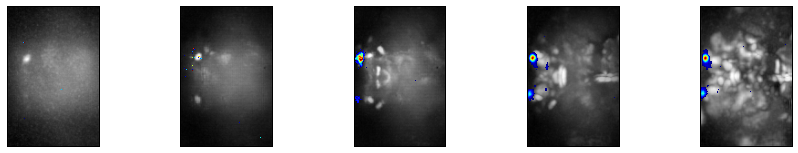

('left:', -0.012457705388208612, 'right:', -0.02075444016860466, 'walk:', 0.012294633492743443)
0.0936904468045
TH-M-300011
Trh-M-200082
TH-M-300011
TH-F-200010


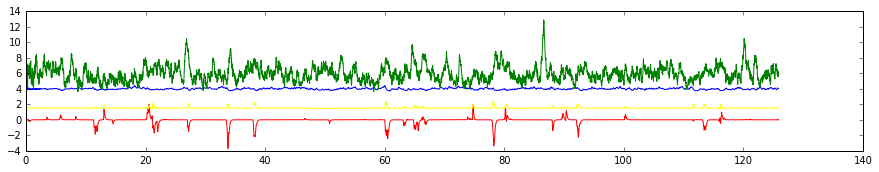

a
36
SMP_R


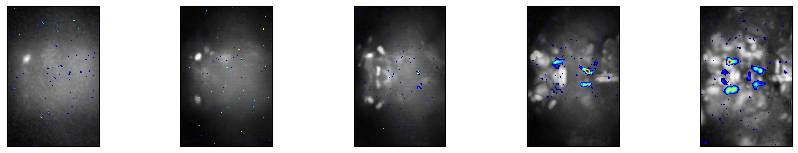

('left:', 0.017737382389399956, 'right:', 0.034921006034731583, 'walk:', -0.0069117815840343474)
0.44390397295
TH-M-000049
TH-M-000048
TH-M-000049
TH-M-000048


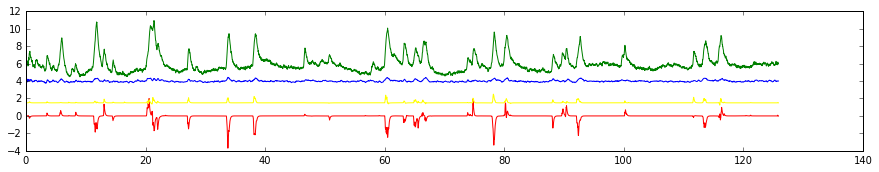

a
37
IB_R


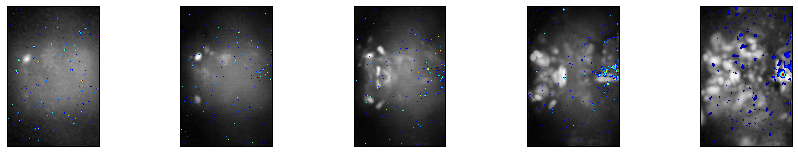

('left:', 0.016187495536134543, 'right:', 0.02466118506361914, 'walk:', 0.00028227209849386939)
0.349559506523
TH-F-300078
TH-F-100005
TH-F-300078
TH-F-100005


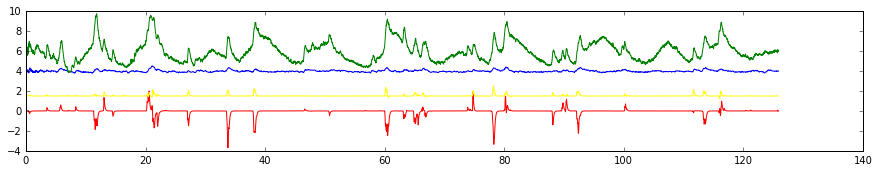


38
SPS_R


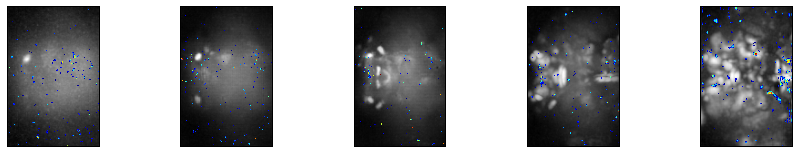

('left:', -0.019874728586924604, 'right:', -0.026228844487840356, 'walk:', 0.011176209052672477)
0.259519551044
Tdc2-F-000027
VGlut-F-200049
TH-F-100005
TH-F-300078


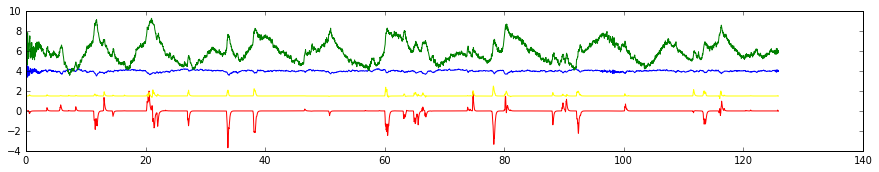


39
SMP_L


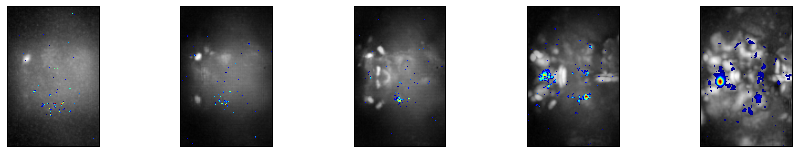

('left:', 0.019424573763995995, 'right:', 0.011581650794265663, 'walk:', -0.0025059870784692653)
0.179934248897
TH-F-000053
VGlut-F-000077
TH-F-000053
TH-F-200092


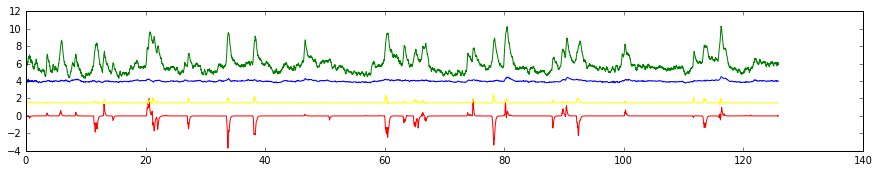

a
40
SPS_R


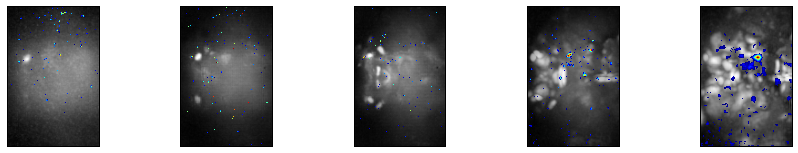

('left:', 0.0093872887652076756, 'right:', 0.029484869537703132, 'walk:', -0.007180116119893918)
0.296969833203
VGlut-F-200049
Tdc2-F-000027
TH-F-100005
TH-F-000079


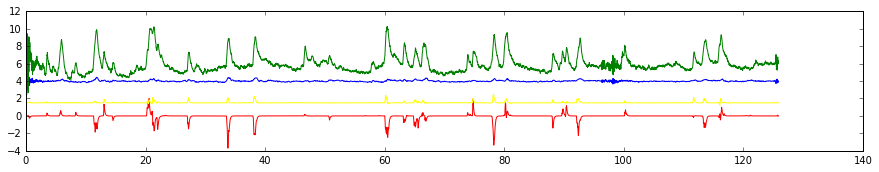


41
IPS_R


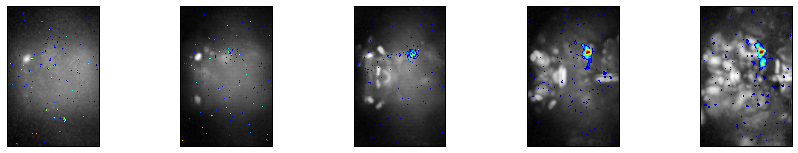

('left:', 0.011726343418968195, 'right:', 0.026513329473177274, 'walk:', -0.00016867568972505492)
0.377151815485
TH-F-200112
Tdc2-F-100053
TH-F-200112
TH-F-200057


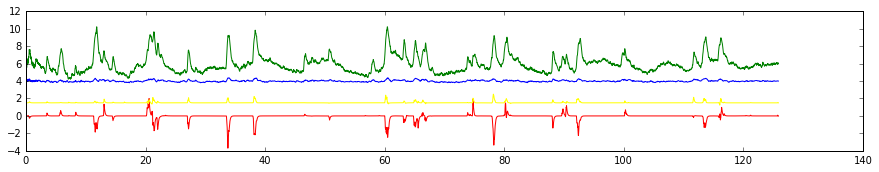

a
42
SCL_L


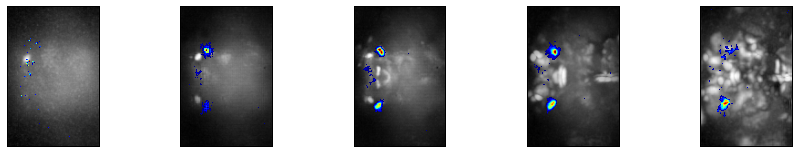

('left:', 0.0016261626437626515, 'right:', 0.0056953328000789016, 'walk:', -0.0020986983772375849)
0.00896307216624
VGlut-F-000081
VGlut-F-000187
TH-M-000042
TH-F-100105


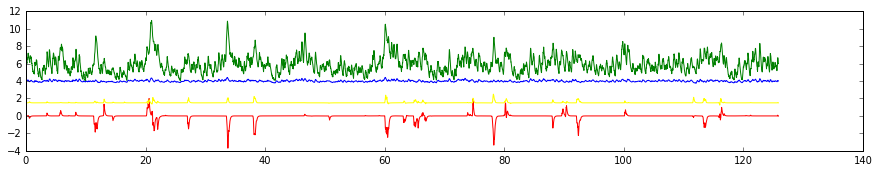

a
43
LO_R


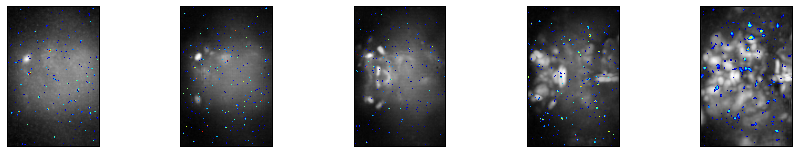

('left:', 0.015987538941700477, 'right:', 0.027778112548581532, 'walk:', -0.0016140433836403963)
0.434261868263
TH-F-100005
TH-F-100105
TH-F-100005
TH-F-100105


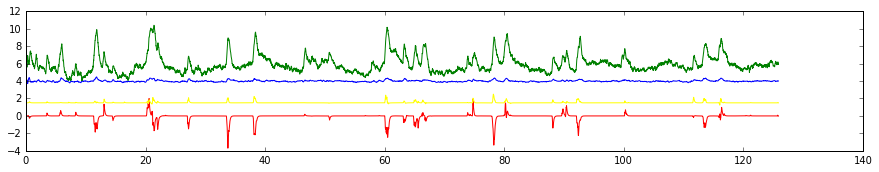


44
SPS_R


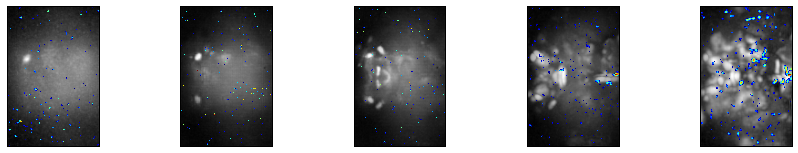

('left:', 0.013080818159055367, 'right:', 0.022574867790260151, 'walk:', -0.0037526562441003442)
0.262675181512
VGlut-F-400077
VGlut-F-500663
TH-F-100005
TH-M-000048


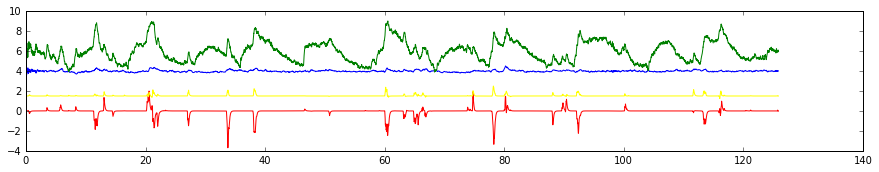


45
SPS_R


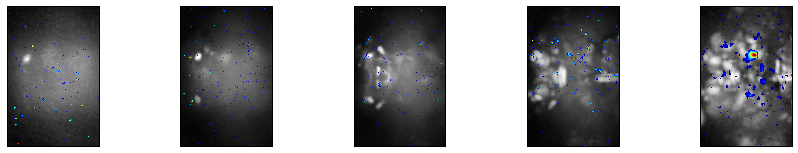

('left:', 0.013101346193380161, 'right:', 0.016808095625402076, 'walk:', 0.00079063546005402399)
0.238717135735
Tdc2-F-000027
VGlut-F-200049
TH-F-100005
TH-F-000079


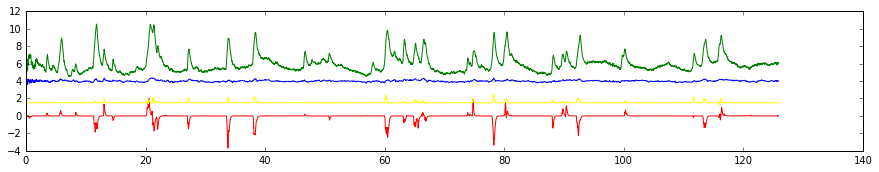


46
ICL_R


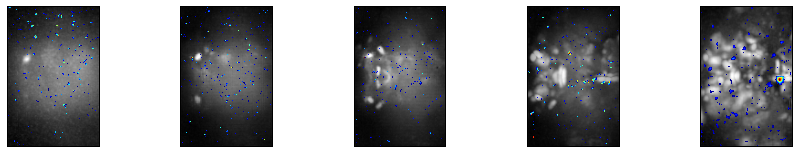

('left:', 0.01573834115792986, 'right:', 0.021231262221360632, 'walk:', -0.00039949359242132457)
0.338977676564
TH-F-100005
TH-F-000079
TH-F-100005
TH-F-000079


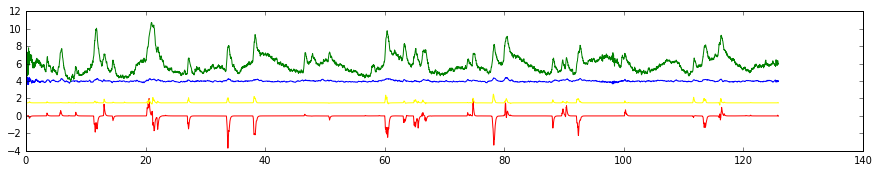


47
GNG


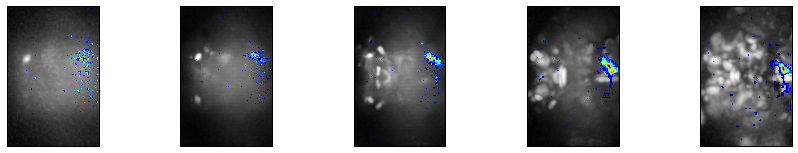

('left:', 0.0061133686844840321, 'right:', 0.0009980245483351244, 'walk:', 0.0036160185117639077)
0.0366123305501
TH-F-000004
TH-M-000007
TH-F-000004
TH-M-000007


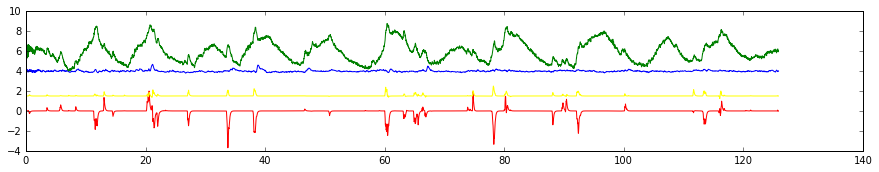


48
SPS_R


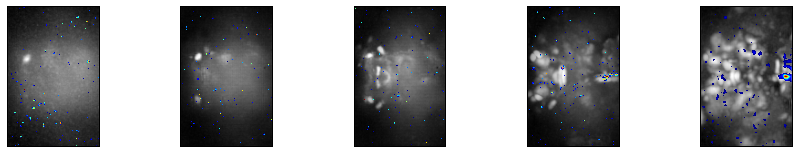

('left:', 0.0088980438690605644, 'right:', 0.011479704559237395, 'walk:', -0.0012253986966905238)
0.0995566097557
Tdc2-F-000027
TH-F-100005
TH-F-100005
TH-F-000079


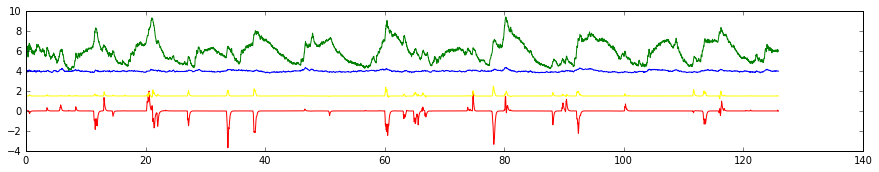


49
IPS_R


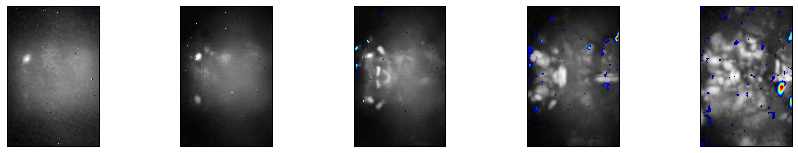

('left:', -0.0017773668039093137, 'right:', -0.021636076258649342, 'walk:', 0.0050652715076400755)
0.183171987244
Trh-F-200023
TH-F-200112
TH-F-200112
TH-F-200057


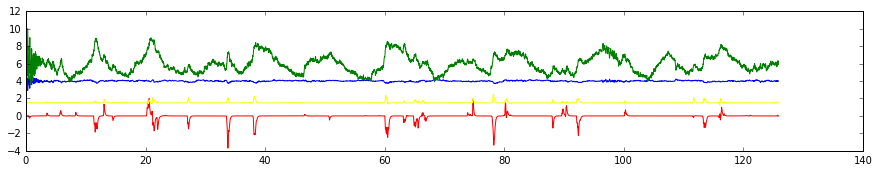


50
SPS_L


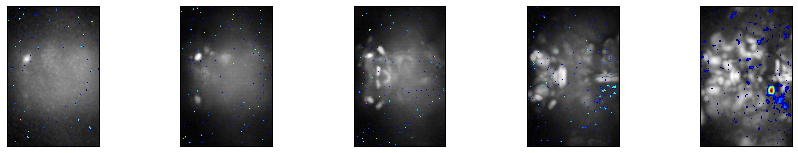

('left:', -0.01017265859578158, 'right:', -0.0241789532728535, 'walk:', 0.0039912537124655173)
0.293516830029
5-HT1B-F-100000
TH-F-100005
TH-F-100005
TH-F-100105


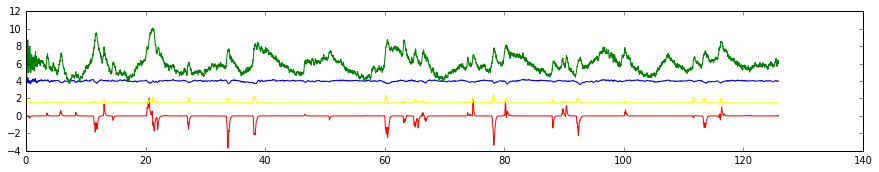


51
IB_R


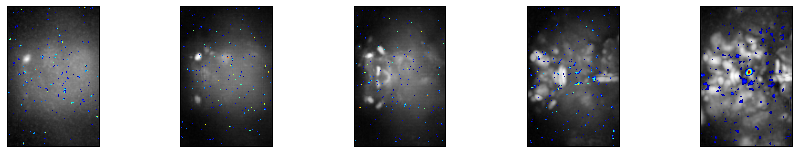

('left:', 0.014495126505196418, 'right:', 0.02702995533423461, 'walk:', -0.0075750599988292124)
0.3499294089
VGlut-F-400077
VGlut-F-400264
TH-M-000048
TH-F-300078


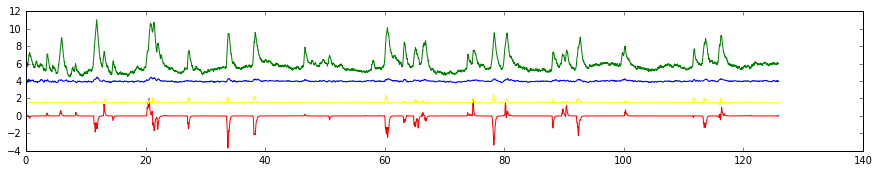


52
SPS_L


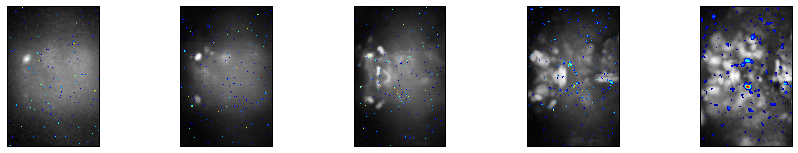

('left:', 0.015379244100067656, 'right:', 0.022273261051410996, 'walk:', -0.0082448800087078378)
0.268134552594
fru-F-100015
5-HT1B-F-100000
TH-F-200020
TH-M-100077


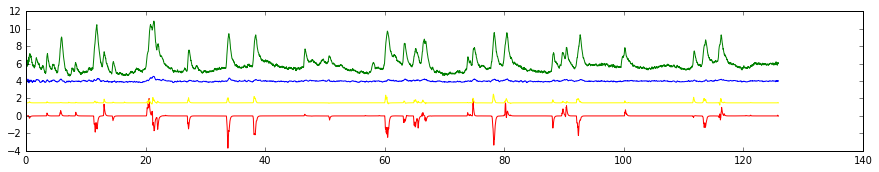


53
GNG


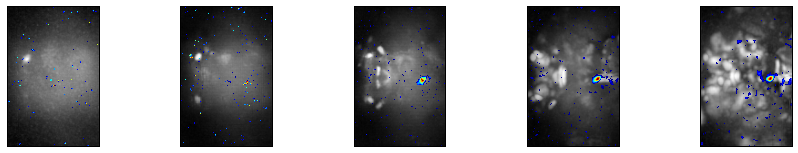

('left:', -0.0084696473417145909, 'right:', -0.021759158412476838, 'walk:', 2.2429056504749689e-05)
0.330362182145
TH-F-000004
TH-M-000007
TH-F-000004
TH-M-000007


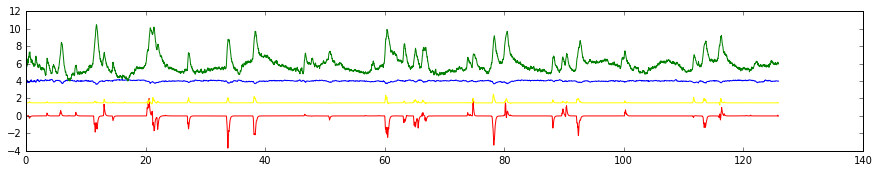


54
IB_L


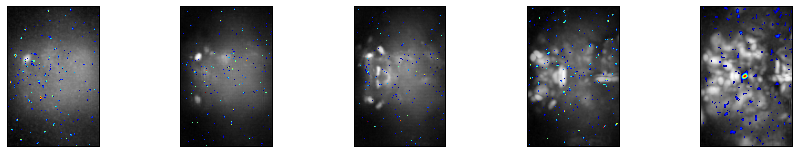

('left:', 0.012885432213375838, 'right:', 0.024651548910647077, 'walk:', -0.0048437944017293115)
0.366718018842
VGlut-F-000071
TH-M-000048
TH-M-000048
TH-F-200020


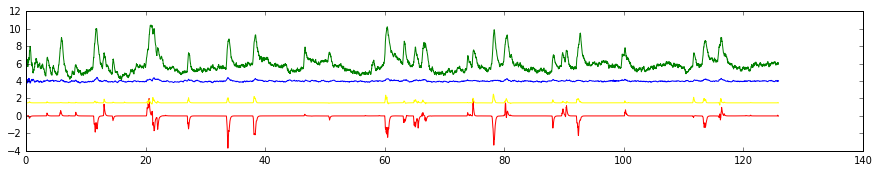


55
SMP_L


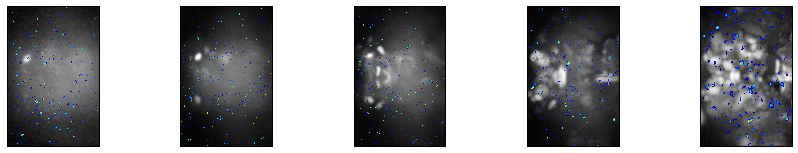

('left:', 0.013681016328802241, 'right:', 0.01940823803939562, 'walk:', -0.0035505553543579461)
0.284055614657
TH-F-200020
VGlut-F-400077
TH-F-200020
TH-F-300078


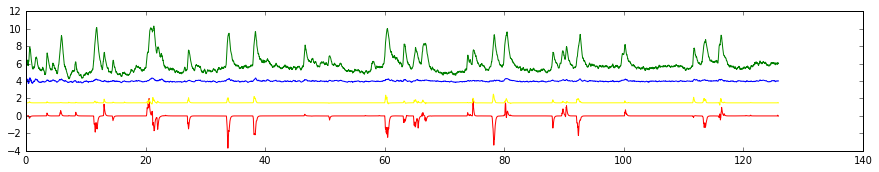


56
ATL_R


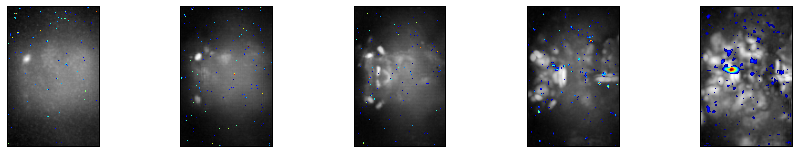

('left:', 0.013344158318745634, 'right:', 0.019847739147046059, 'walk:', -0.0058688138379495453)
0.249724160006
VGlut-F-100188
TH-M-000049
TH-M-000049
TH-F-000023


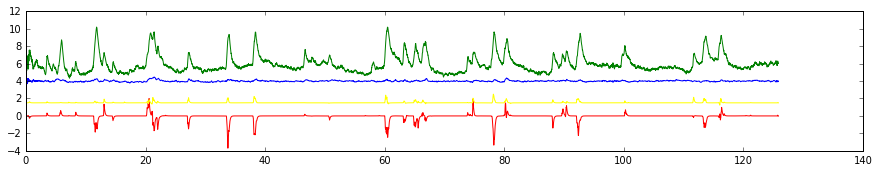

a
57
CRE_R


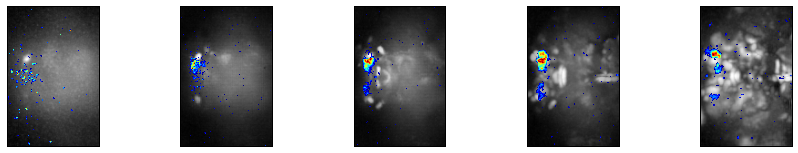

('left:', -0.0090390250702398599, 'right:', -0.014350772671816786, 'walk:', 0.0028556575360385791)
0.141863029964
TH-F-000019
TH-M-300011
TH-F-000019
TH-M-300011


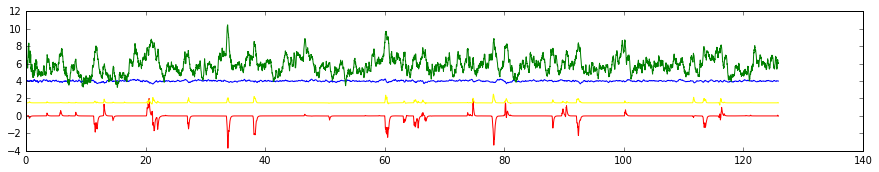

a
58
GNG


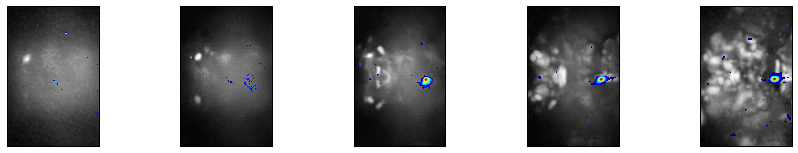

('left:', -0.0050997826143813711, 'right:', -0.0092660281987515733, 'walk:', 0.0010017375779721414)
0.0624367471431
TH-F-000004
TH-M-000007
TH-F-000004
TH-M-000007


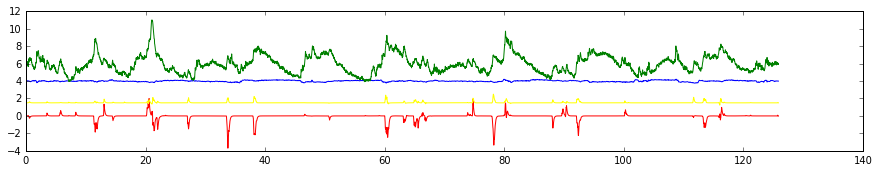


59
ME_L


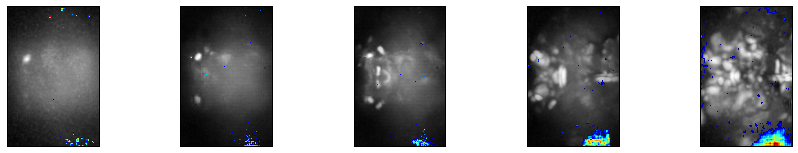

('left:', -0.0088899996429556323, 'right:', -0.015544718726895345, 'walk:', 0.0039265753825235457)
0.148587350982
VGlut-F-300025
VGlut-F-400614
TH-F-100005
TH-F-000079


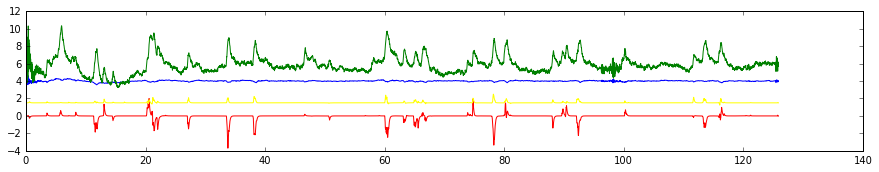


60
MB_ML_R


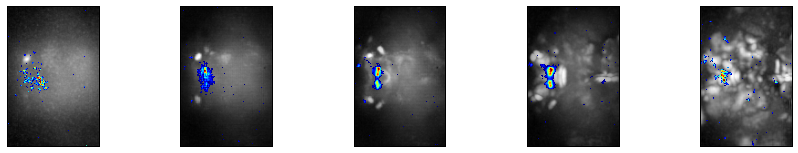

('left:', -0.0080416752123104469, 'right:', -0.0097516196003635501, 'walk:', -0.0025269890568148743)
0.143078841631
Trh-M-200082
Trh-M-200129
TH-M-300055
TH-F-000019


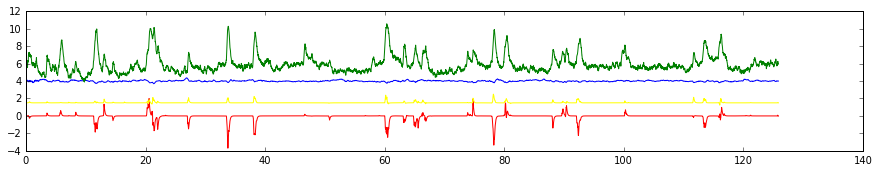

a
61
PLP_R


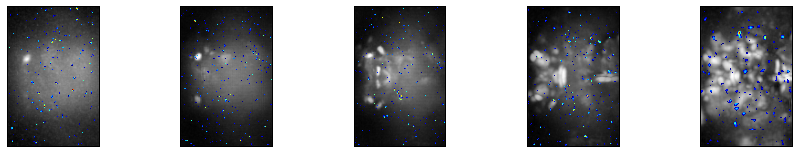

('left:', 0.01513958889287517, 'right:', 0.019450633364257699, 'walk:', -0.0031060443759208488)
0.354417928346
TH-F-100105
VGlut-F-100092
TH-F-100105
TH-F-100005


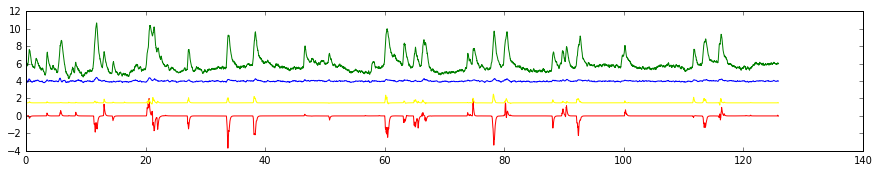


62
IB_R


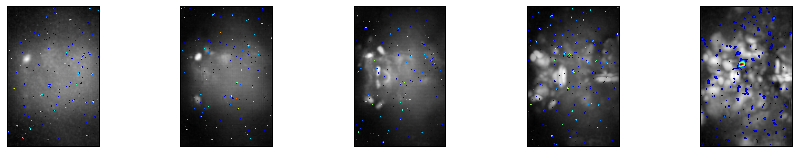

('left:', 0.013919531970806562, 'right:', 0.015518388433764938, 'walk:', -0.001740398378106859)
0.272149519009
VGlut-F-400264
VGlut-F-400077
TH-F-300078
TH-F-100005


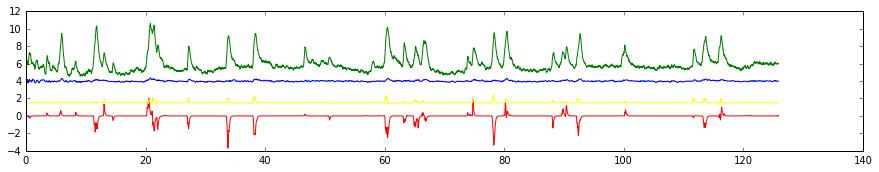


63
LOP_L


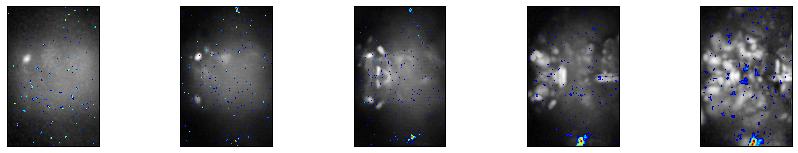

('left:', 0.011272537851400491, 'right:', 0.018002357539623971, 'walk:', -0.0033397248462445628)
0.251105652681
VGlut-F-400077
VGlut-F-000071
TH-M-000048
TH-F-300078


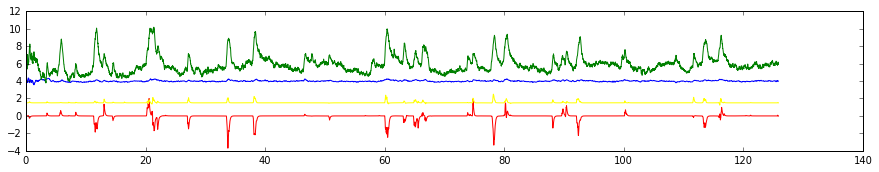


64
GNG


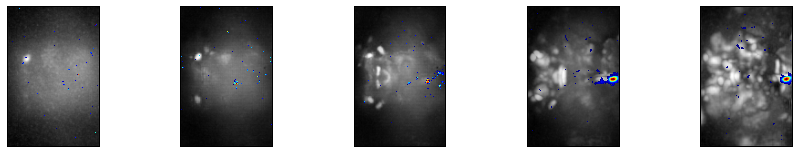

('left:', 0.0044657137974201191, 'right:', -0.0014351564338919301, 'walk:', 0.0069471972994486937)
0.0534191718566
TH-F-000004
TH-F-000013
TH-F-000004
TH-F-000013


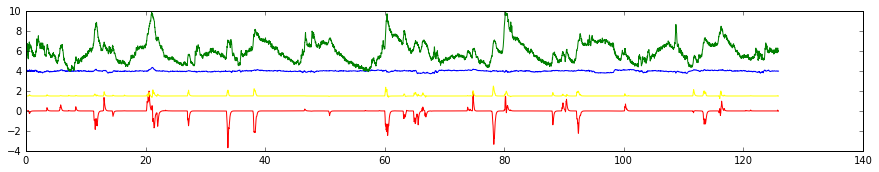


65
SLP_L


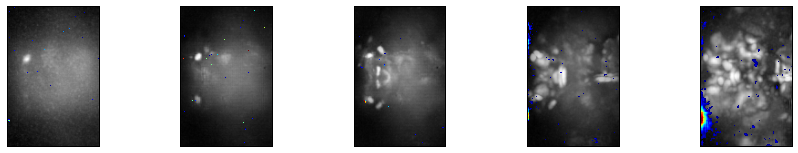

('left:', -0.010870155256875184, 'right:', -0.013203476680212434, 'walk:', 0.0010098239744618723)
0.199295906427
Trh-F-200023
TH-M-000013
TH-M-000013
TH-F-300052


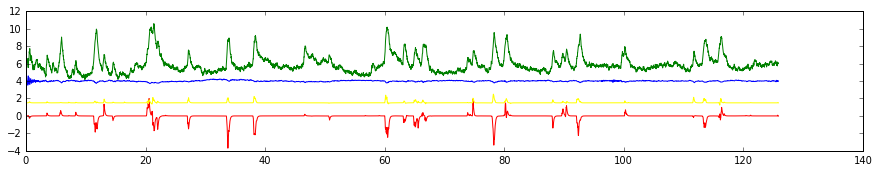


66
GNG


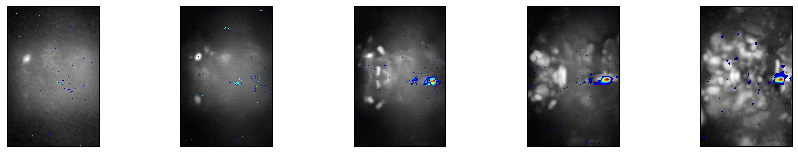

('left:', -0.0010053429501698833, 'right:', -0.0059259934255413652, 'walk:', 0.0020574587947694385)
0.0156595464515
TH-F-000004
TH-F-000013
TH-F-000004
TH-F-000013


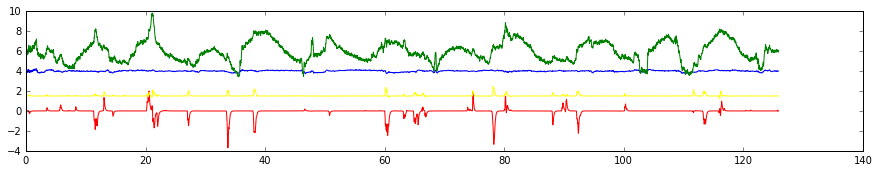


67
SLP_L


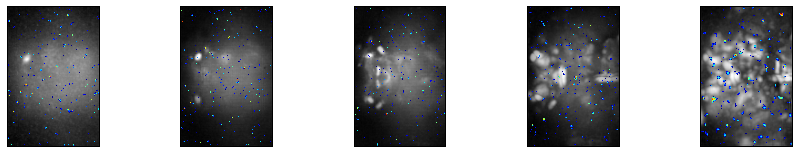

('left:', 0.0092686545671451012, 'right:', 0.021421241992142181, 'walk:', -0.0035063667276165576)
0.334519904505
Trh-F-200023
TH-F-100005
TH-F-100005
TH-M-000013


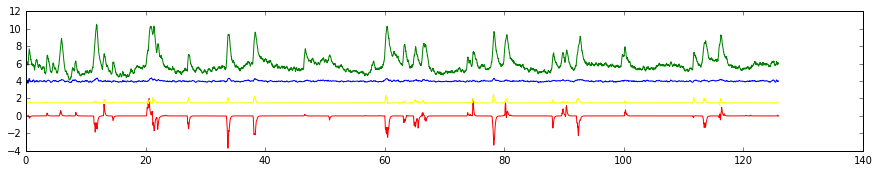


68
SMP_R


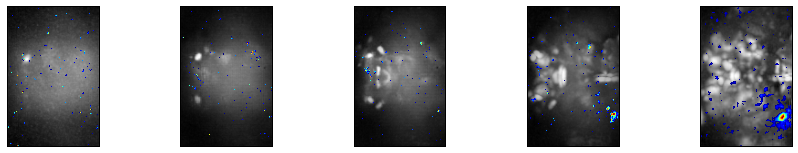

('left:', 0.00069661348946870396, 'right:', 0.0075890351306102978, 'walk:', 0.0017719364741610785)
0.0654593252663
TH-M-000049
VGlut-F-200062
TH-M-000049
TH-F-000019


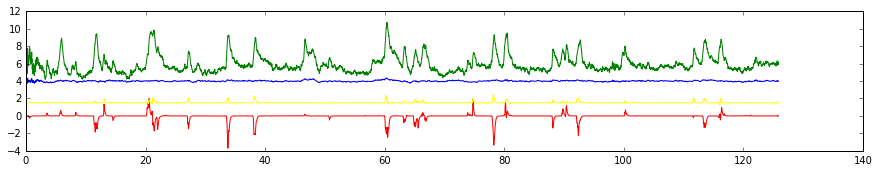


69
SLP_R


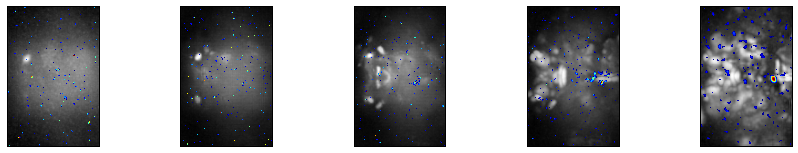

('left:', 0.0079016497452866902, 'right:', 0.014572028465914114, 'walk:', -0.0036285876267076415)
0.158056085213
TH-M-000030
TH-F-000012
TH-M-000030
TH-F-000012


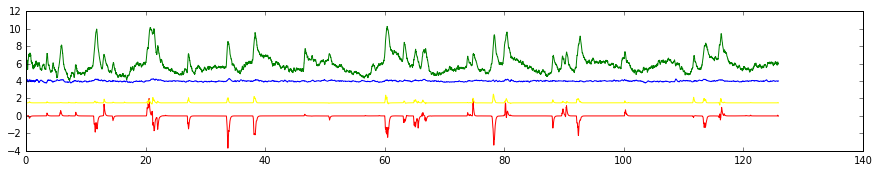


70
IB_R


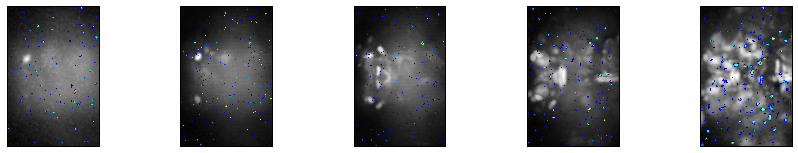

('left:', 0.0089951140285091536, 'right:', 0.016322358563150528, 'walk:', -0.0042076363134048497)
0.204438326523
TH-F-100005
VGlut-F-400077
TH-F-100005
TH-F-000079


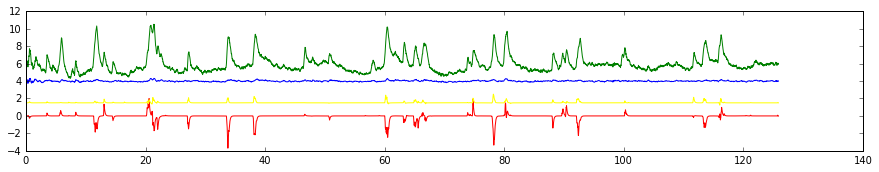


71
SCL_R


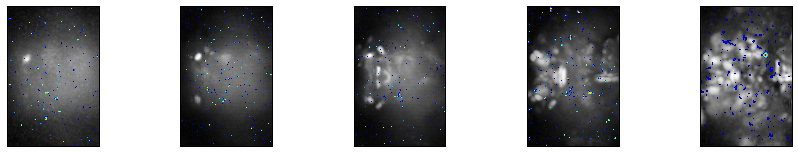

('left:', 0.012351407434246989, 'right:', 0.017390343591576731, 'walk:', -0.0047432980634238738)
0.279046872512
TH-F-100105
VGlut-F-100092
TH-F-100105
TH-F-300004


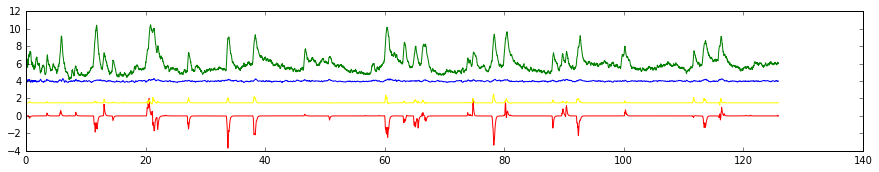


72
SMP_R


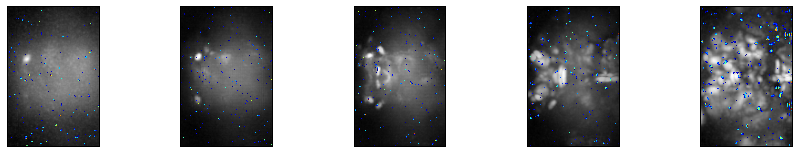

('left:', -0.0094464984963240541, 'right:', -0.010106310302336361, 'walk:', 0.0014689515016035361)
0.151816815179
VGlut-F-200062
Trh-M-200041
TH-M-300011
TH-F-000012


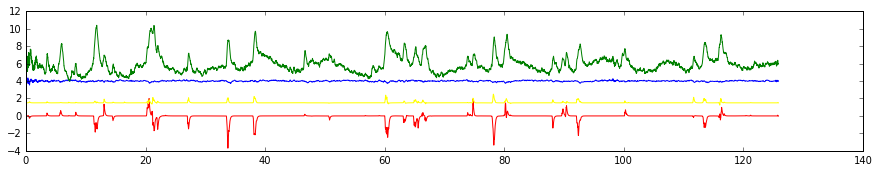


73
SMP_R


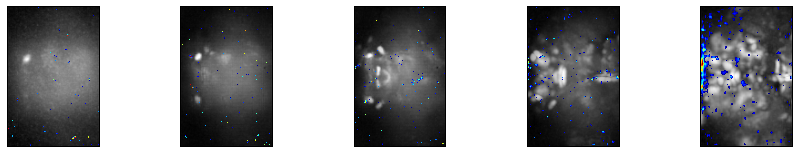

('left:', -0.0055052723605785387, 'right:', -0.0015560990099409075, 'walk:', -0.0003291653673589889)
0.0329762476111
TH-M-300011
TH-F-000012
TH-M-300011
TH-F-000012


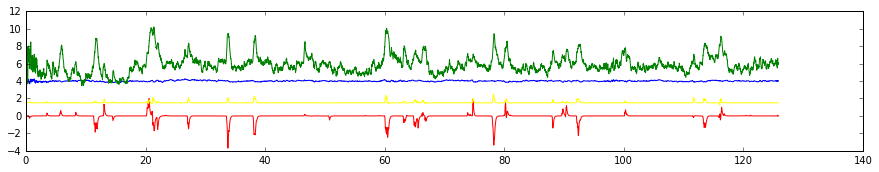


74
IB_L


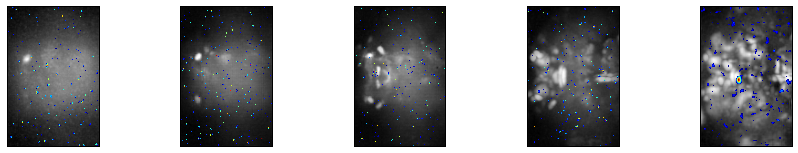

('left:', 0.0087911115022115717, 'right:', 0.016433816347305338, 'walk:', -0.0029617670547771365)
0.259296852409
TH-M-000048
TH-F-200020
TH-M-000048
TH-F-200020


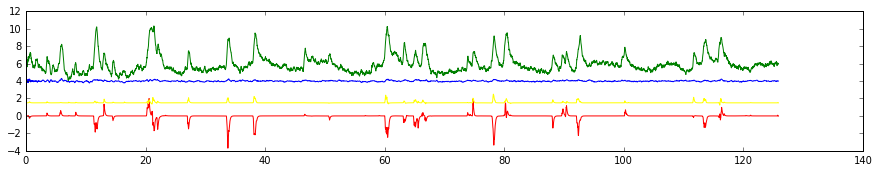


75
SMP_R


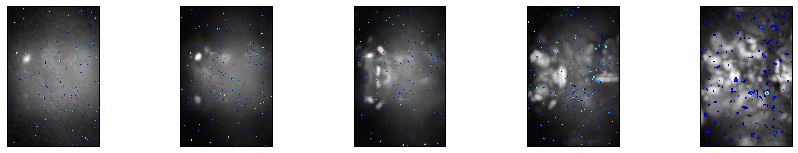

('left:', 0.01049179729081297, 'right:', 0.0064096180462998049, 'walk:', 0.0011854208301348944)
0.165395036139
TH-F-200020
5-HT1B-F-100000
TH-F-200020
TH-M-300011


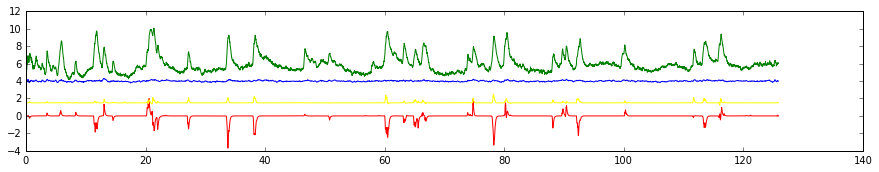


76
SPS_L


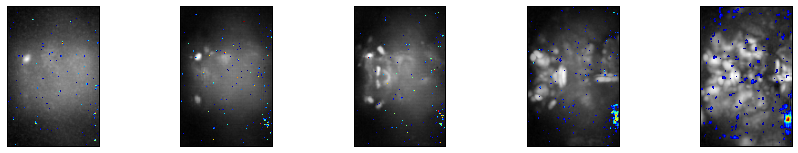

('left:', 0.0055521054425042788, 'right:', 0.010252641243980197, 'walk:', -0.0015719934554087999)
0.107207002293
5-HT1B-F-100000
Trh-F-200023
TH-F-100005
TH-F-300078


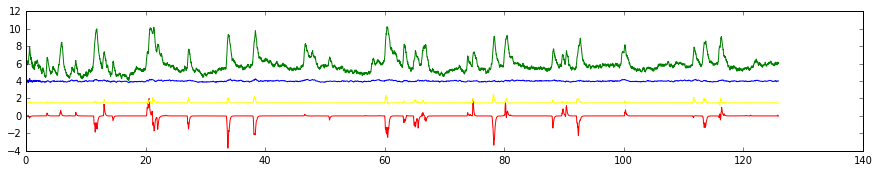


77
GNG


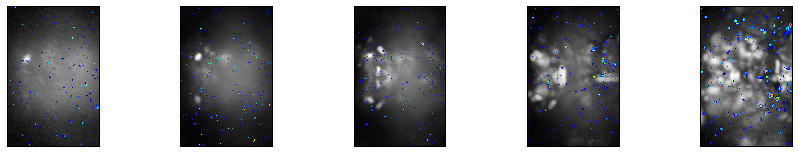

('left:', -0.0047426450532860806, 'right:', -0.0086947805102304578, 'walk:', -0.00032125301469985816)
0.104493740475
Trh-F-200023
TH-F-000004
TH-F-000004
TH-M-000007


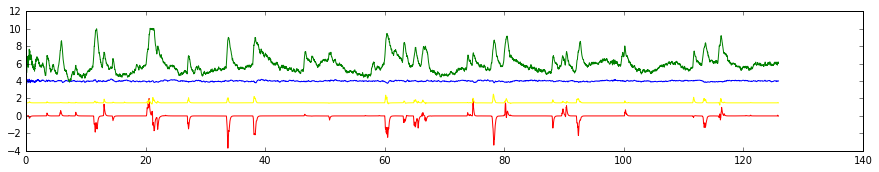


78
GNG


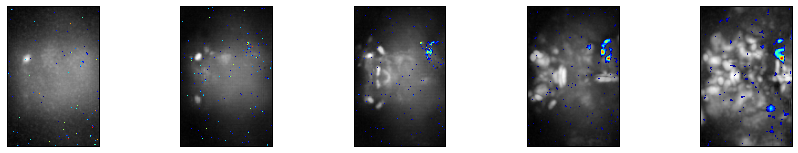

('left:', -0.00314883158070229, 'right:', -0.0079250260521069246, 'walk:', -0.0024678700979032468)
0.116145331294
TH-F-000004
TH-M-000007
TH-F-000004
TH-M-000007


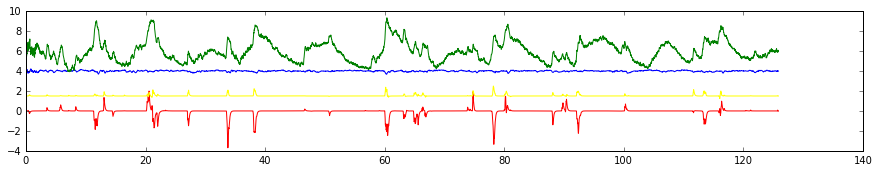


79
SMP_R


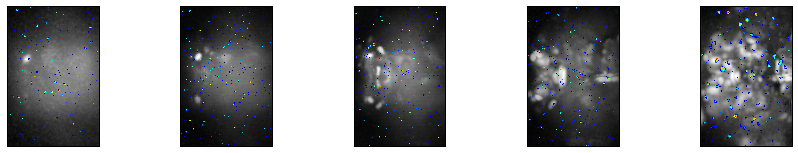

('left:', 0.0063810178289628837, 'right:', 0.018867391390053403, 'walk:', -0.0067987462360723887)
0.231652138128
TH-M-000049
VGlut-F-200062
TH-M-000049
TH-M-300011


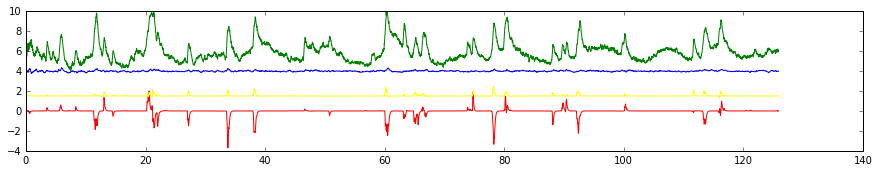


80
SMP_R


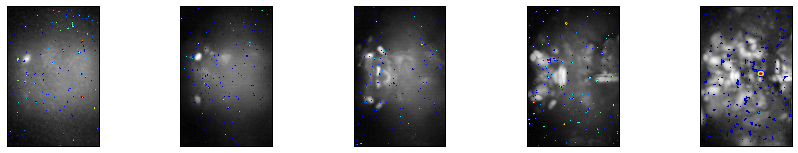

('left:', 0.0068436112764843704, 'right:', 0.0078751775232202576, 'walk:', -0.0038297539418171989)
0.0679344674221
TH-M-000049
VGlut-F-200062
TH-M-000049
TH-M-000048


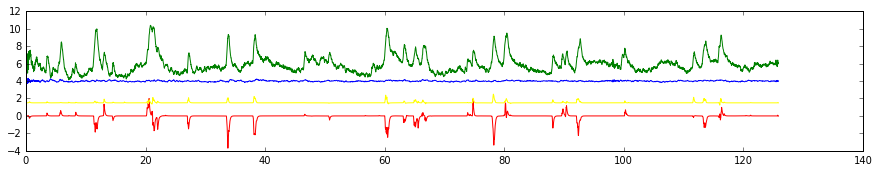


81
MB_CA_R


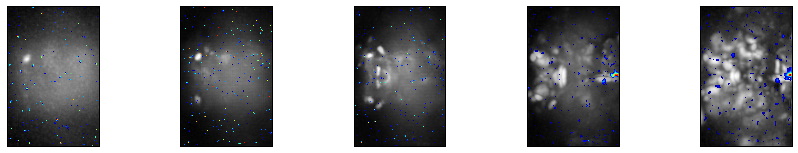

('left:', -0.0069212073419546195, 'right:', -0.012072150746283412, 'walk:', 0.0018042181864666475)
0.168850399369
Trh-F-600017
TH-F-300078
TH-F-300078
TH-F-000011


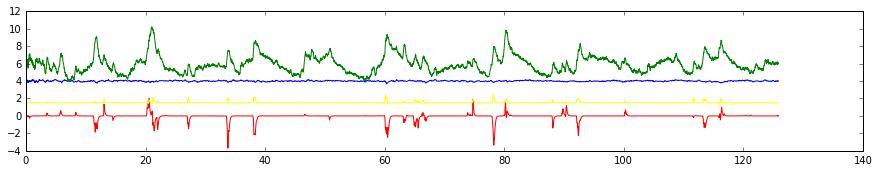


82
LO_R


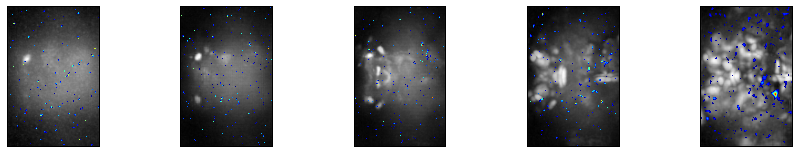

('left:', -0.00094470095169793436, 'right:', -0.010824965055902979, 'walk:', 0.0043729668533289447)
0.0707932617221
Trh-F-200023
VGlut-F-500422
TH-M-000013
TH-F-100046


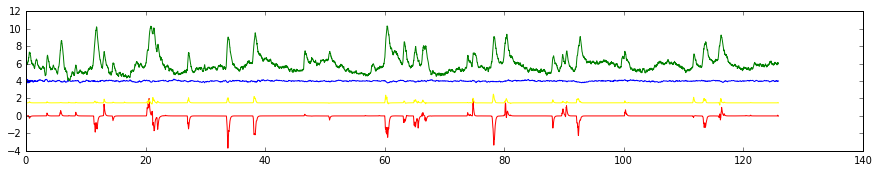


83
SMP_R


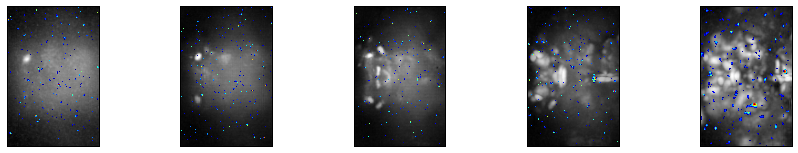

('left:', 0.0065605571938818618, 'right:', 0.010780875646060492, 'walk:', -0.0008150297972527084)
0.163643217846
TH-F-000012
TH-M-000030
TH-F-000012
TH-M-000030


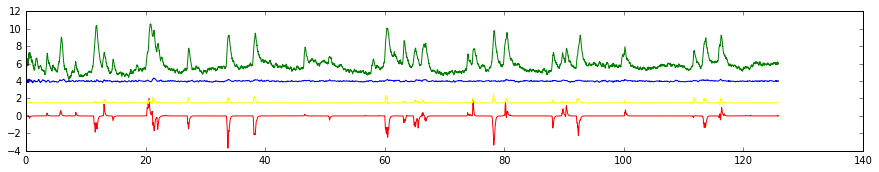


84
SMP_L


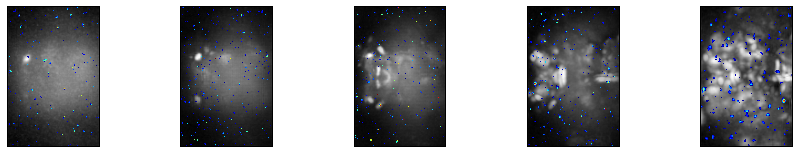

('left:', -0.0058410408292166073, 'right:', -0.011566950685558249, 'walk:', 4.1740186641835847e-05)
0.192411509725
TH-M-000030
TH-F-000012
TH-M-000030
TH-F-000012


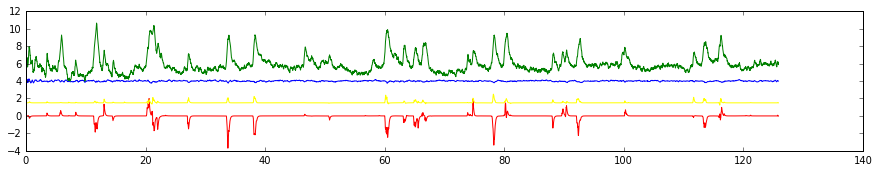


85
ICL_R


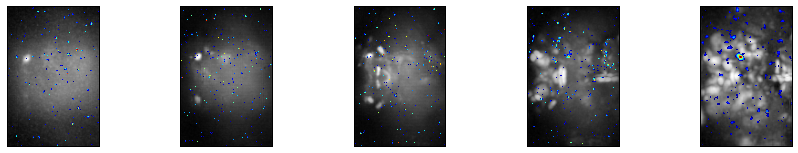

('left:', 0.0077001252883114255, 'right:', 0.010488306894561216, 'walk:', -0.0047368878286982424)
0.114148813871
TH-F-100005
TH-F-000079
TH-F-100005
TH-F-000079


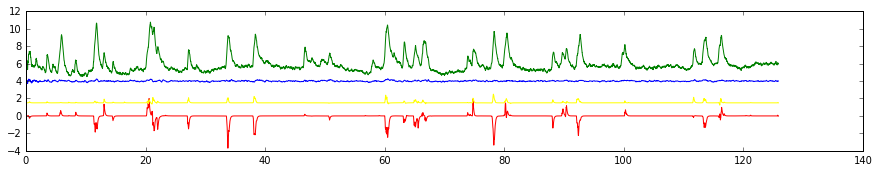


86
SPS_R


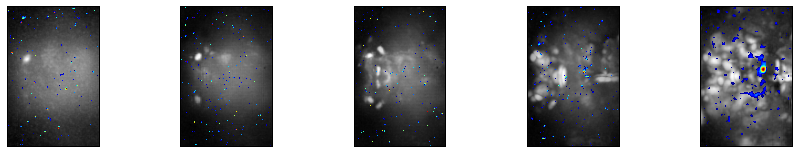

('left:', 0.0020493688609587264, 'right:', -0.0044260904674347044, 'walk:', -0.00057402666207670514)
0.0321862290089
Tdc2-F-000027
Tdc2-F-000024
TH-F-300004
TH-F-100005


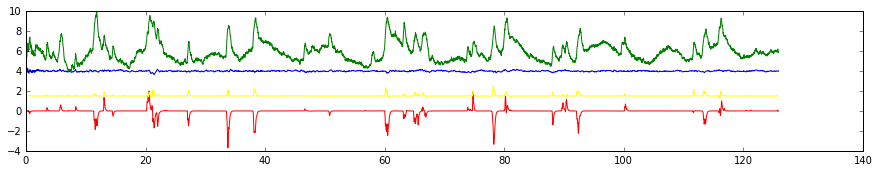


87
SPS_R


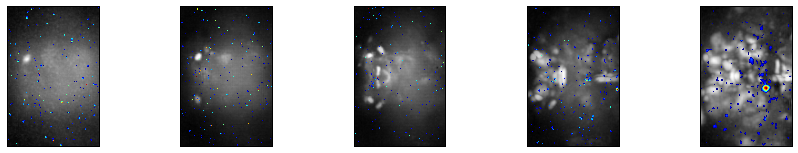

('left:', 0.0038458139624141133, 'right:', 0.0020374404971024935, 'walk:', 0.00061360556049090817)
0.0272513725182
Tdc2-F-000027
TH-F-100005
TH-F-100005
TH-F-000079


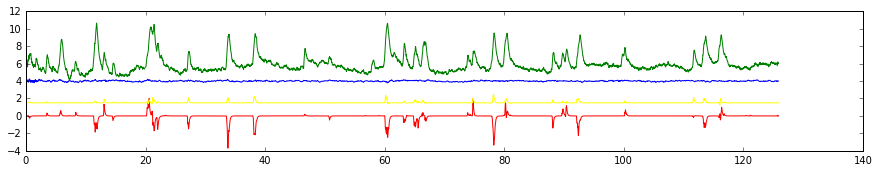


88
LOP_R


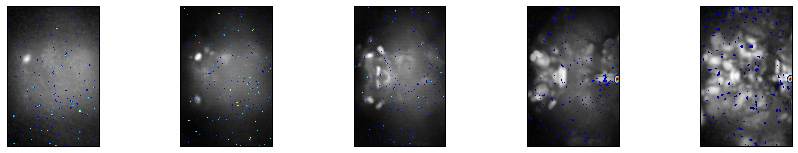

('left:', -0.0043547779048297725, 'right:', -0.0060222466188058479, 'walk:', -0.0001479854203531002)
0.0716805093502
VGlut-F-400614
VGlut-F-300025
TH-F-000012
TH-M-000030


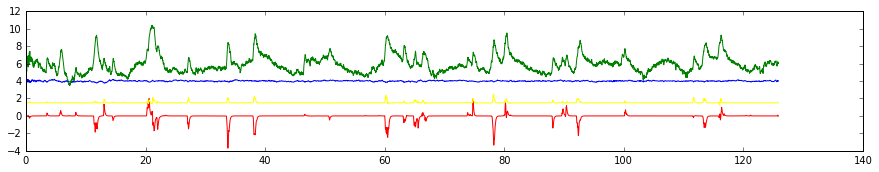


89
SMP_L


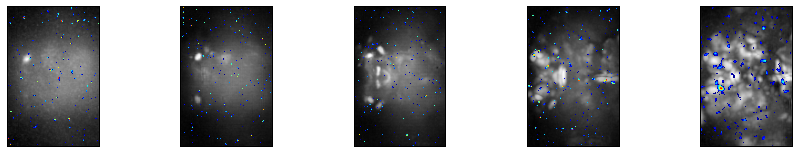

('left:', 0.0020967317963768049, 'right:', 0.0085529716254384557, 'walk:', -0.0015308251639387866)
0.074100766166
TH-F-000053
VGlut-F-000077
TH-F-000053
TH-F-200092


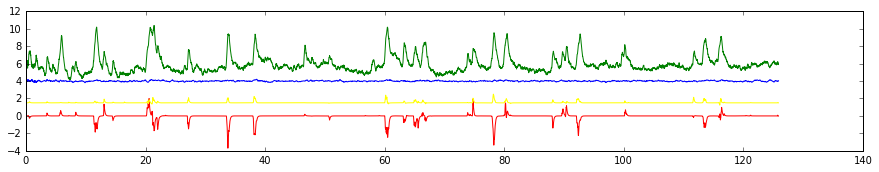


90
LO_R


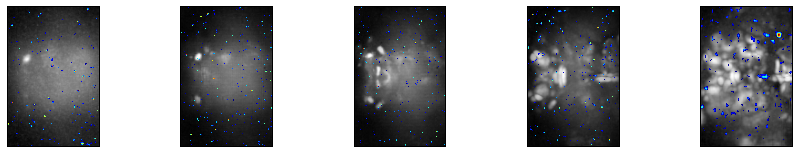

('left:', -0.0038583285495136033, 'right:', -0.0085179777478338412, 'walk:', 0.0017171749918445433)
0.0822804847159
TH-M-000030
TH-F-000012
TH-M-000030
TH-F-000012


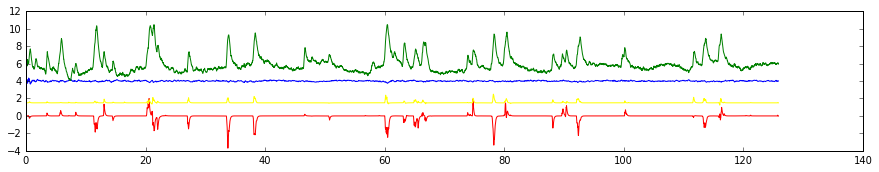


91
SMP_L


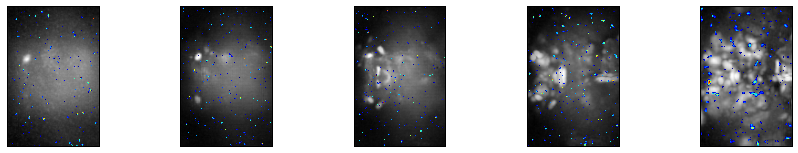

('left:', -0.0038478370662465931, 'right:', -0.011069716864290743, 'walk:', 0.0047433670563065801)
0.0911088380845
TH-F-000053
Trh-F-200023
TH-F-000053
TH-F-200092


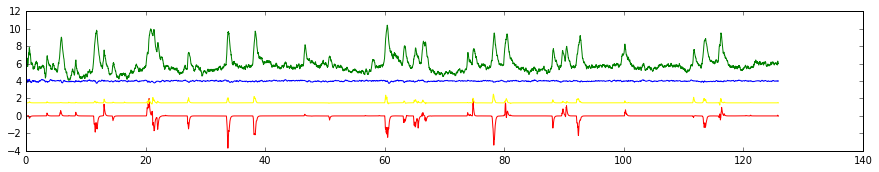


92
ME_R


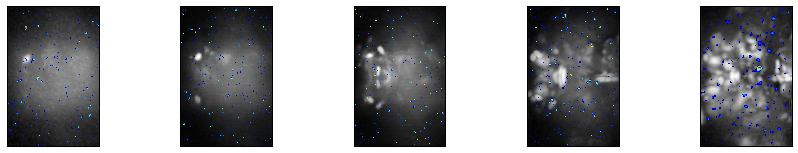

('left:', -0.0064229271202862603, 'right:', -0.0066232996419558817, 'walk:', 0.0002092799053642104)
0.106620419891
TH-M-000013
Trh-F-200023
TH-M-000013
TH-M-000030


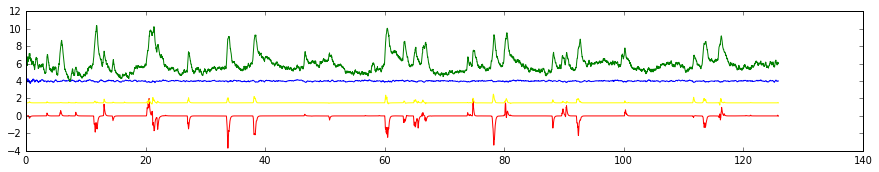


93
SPS_R


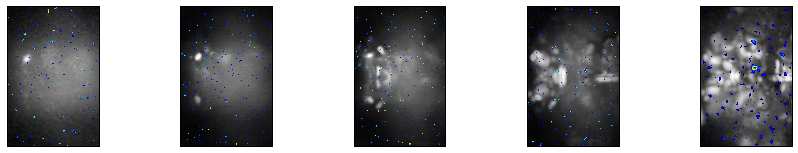

('left:', -0.0054639634946712611, 'right:', -0.0052258790899016583, 'walk:', 0.0011136582126159266)
0.060413795228
TH-F-100005
Tdc2-F-000027
TH-F-100005
TH-F-000079


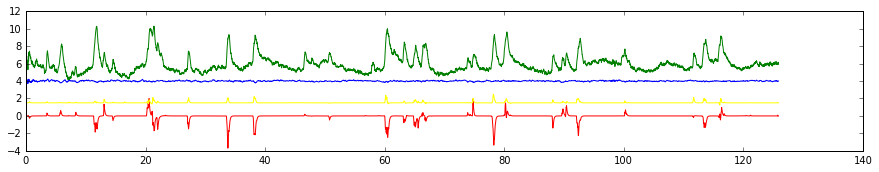


94
SLP_L


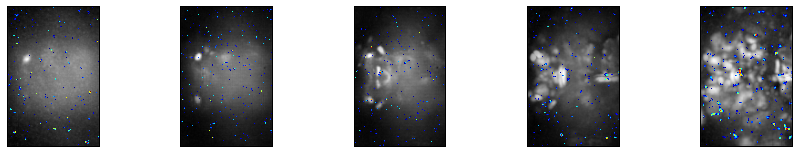

('left:', -0.0059165576676514908, 'right:', -0.0091610935263060442, 'walk:', 0.0033735641952079374)
0.0952832049738
TH-M-000013
TH-M-000042
TH-M-000013
TH-M-000042


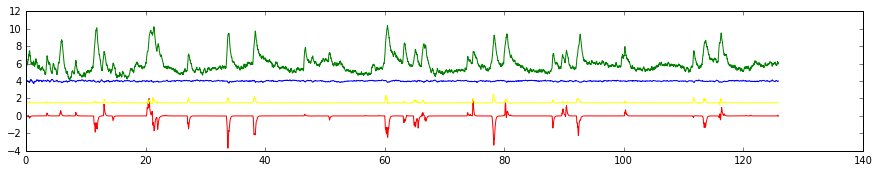


95
FB


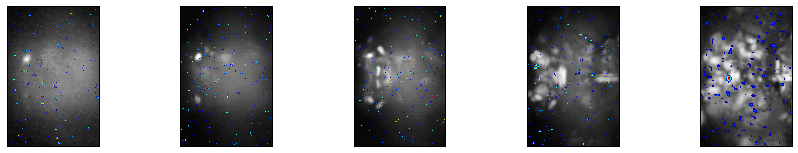

('left:', 0.0058044425862674694, 'right:', 0.0075271522495263836, 'walk:', -0.0048583769919302525)
0.0578610423685
VGlut-F-000067
TH-F-300019
TH-F-300019
TH-M-100050


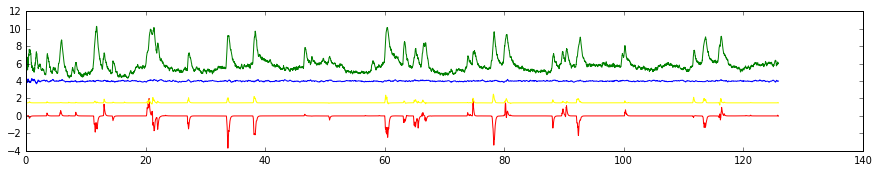


96
SPS_R


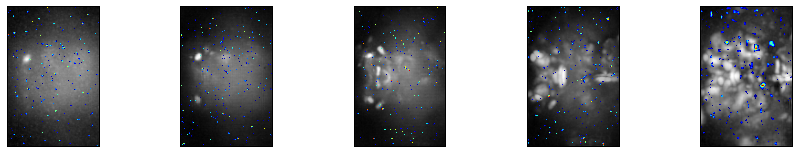

('left:', 0.0054300491351410895, 'right:', 0.0071960264997479846, 'walk:', -0.0017100695469343822)
0.0821610747857
TH-F-100105
TH-F-100005
TH-F-100105
TH-F-100005


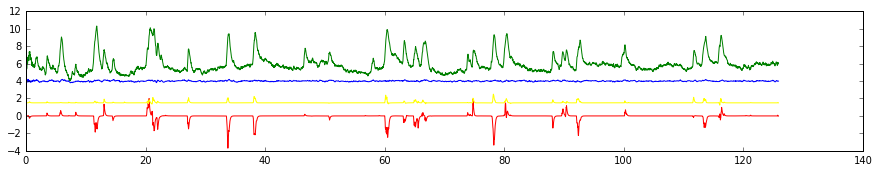


97
IB_R


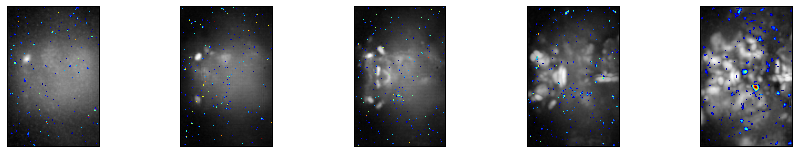

('left:', 0.0076035516140785884, 'right:', 0.00066058754188925831, 'walk:', -0.0018059471170825394)
0.0692793594763
VGlut-F-400264
VGlut-F-400077
TH-F-300078
TH-M-000026


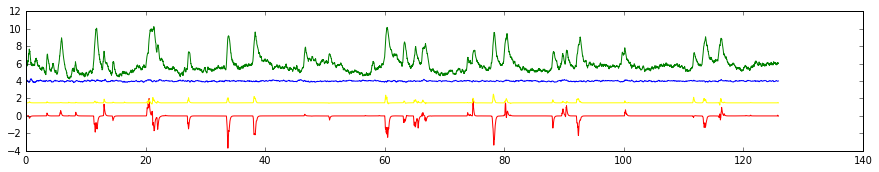


98
SMP_L


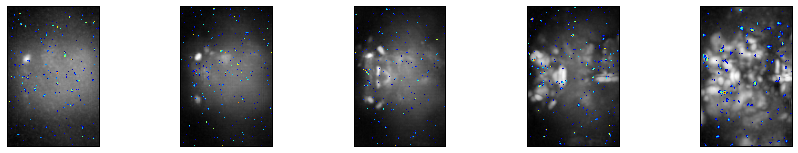

('left:', -0.0027944020522937458, 'right:', -0.0031615644936157346, 'walk:', 0.002113083832424539)
0.0120650750141
TH-F-000053
VGlut-F-000077
TH-F-000053
TH-F-200092


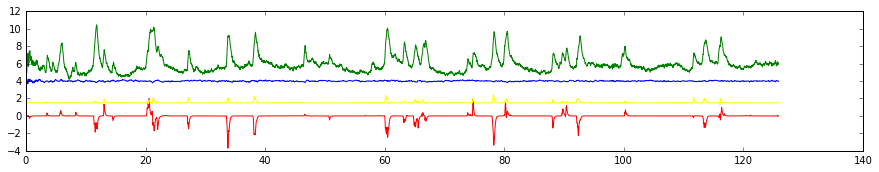


99
SPS_L


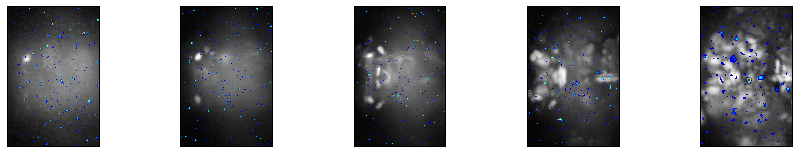

('left:', 0.0059005059186768172, 'right:', 0.0045176245275131352, 'walk:', 7.6506582968943575e-05)
0.0787663543423
VGlut-F-000071
Tdc2-F-000042
TH-F-200020
TH-F-200035


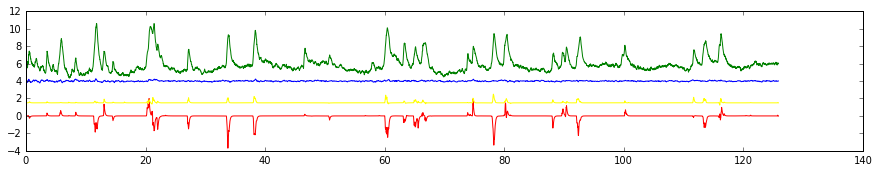


100
SMP_R


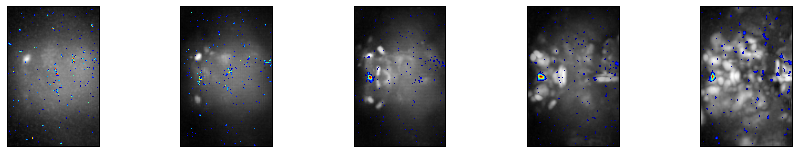

('left:', 0.00022976126604578454, 'right:', 0.0023968275301705865, 'walk:', 0.00016776026499814526)
0.00904309001305
TH-M-000049
TH-M-000038
TH-M-000049
TH-M-000038


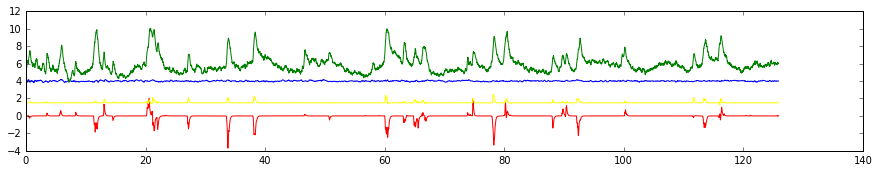

a
101
SMP_R


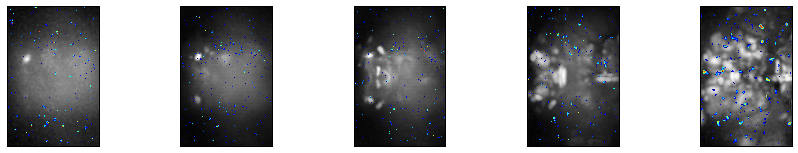

('left:', 0.0015205687781042546, 'right:', -0.00013006110485410814, 'walk:', 0.0013162206184803647)
0.00705504683437
TH-M-000049
TH-F-100105
TH-M-000049
TH-F-100105


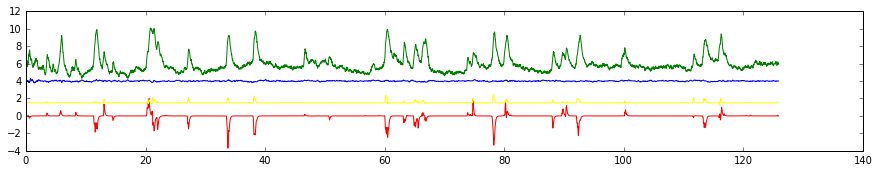


102
SPS_L


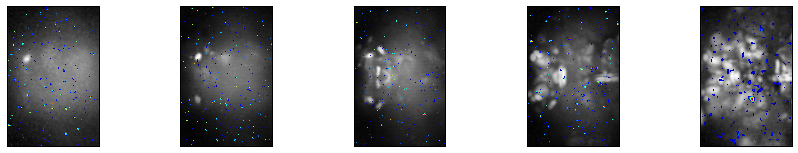

('left:', 0.0038513197332068999, 'right:', 0.0033999744038285609, 'walk:', 0.0007018309747243226)
0.0462726040484
TH-F-200020
Tdc2-F-000042
TH-F-200020
TH-F-100051


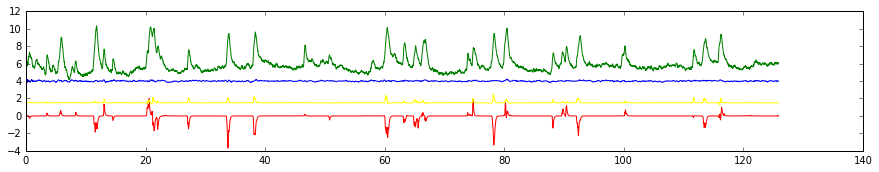


103
SMP_L


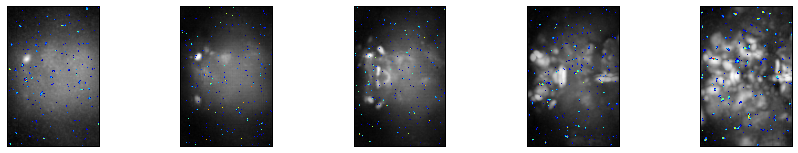

('left:', -0.00083802045273331696, 'right:', 0.0051744347511746063, 'walk:', -0.00043098943141726097)
0.0355047012626
TH-F-100005
TH-F-100105
TH-F-100005
TH-F-100105


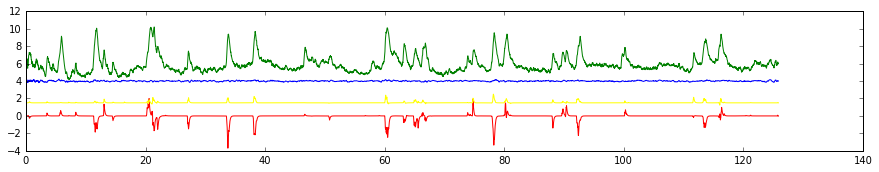


104
MB_VL_L


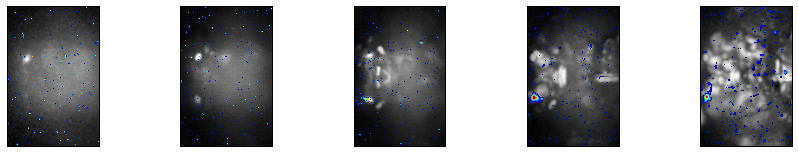

('left:', 0.0011344890229512325, 'right:', -0.0012052480253233232, 'walk:', 0.00026775021435317776)
0.0036214071171
Trh-M-200086
Trh-M-100000
TH-M-100075
TH-F-200012


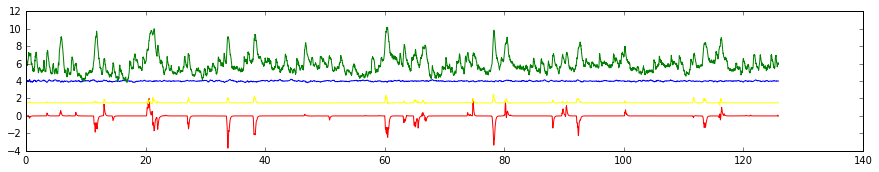

a
105
MB_CA_L


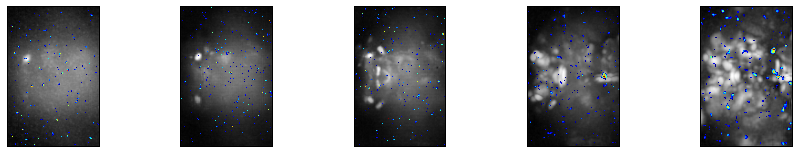

('left:', 0.0010793188025400345, 'right:', 0.0039423215032643169, 'walk:', 0.00013734031902984129)
0.027353654045
TH-M-000042
VGlut-F-000167
TH-M-000042
TH-F-100005


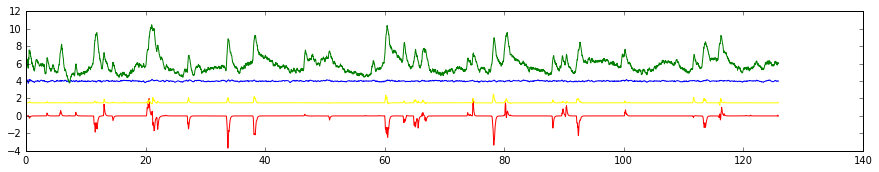


106
MB_CA_R


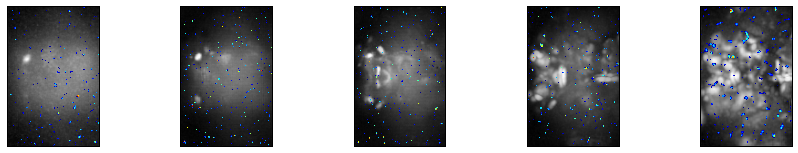

('left:', 0.0021397905549782408, 'right:', 0.00072477953916747894, 'walk:', -0.0018281826757468264)
0.00648643227562
TH-F-000012
TH-M-000030
TH-F-000012
TH-M-000030


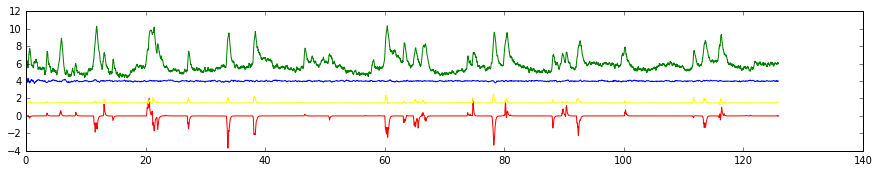


107
LO_R


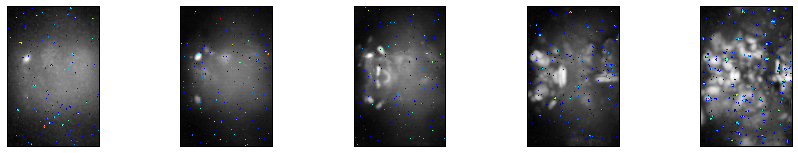

('left:', 0.0018957968165023657, 'right:', 0.00049108401405831173, 'walk:', -0.00098940030829276467)
0.00469335297843
Trh-F-200023
TH-M-000013
TH-M-000013
TH-F-200020


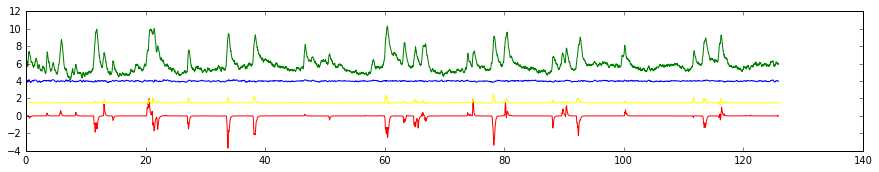


108
SMP_R


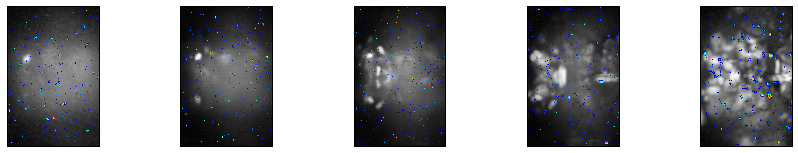

('left:', 0.0024980814130145263, 'right:', 0.00080221429884716044, 'walk:', 0.0018302970911353621)
0.0241372132083
5-HT1B-F-100000
TH-M-000049
TH-M-000049
TH-F-200020


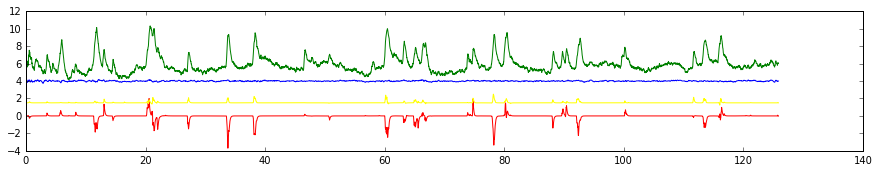

In [263]:
for j in range(S[3]):

    a=''
    if S[2]>5:
        for i in range(Nstack):
            V=Dmaps[:,:,Indices[i],j]
            D1[:,:,i]=np.max(V,2)
        D2[:,:,:,j]=D1
        D1[D1==0]=np.nan
           
    else:
        for i in range(S[2]):
            V=Dmaps[:,:,i,Order[j]]
            D1[:,:,i]=V 

    if (CompMainName[j] != ''):
        print(j)
        print(CompMainName[j])
        for i in range(Nstack):
            plt.subplot(1,5,i+1)
            plt.imshow(Dmean[:,:,i],cmap=plt.cm.gray)
            plt.imshow(D1[:,:,i], cmap=my_cmap,interpolation='none')
            frame1 = plt.gca()
            frame1.axes.get_xaxis().set_visible(False)
            frame1.axes.get_yaxis().set_visible(False)
        
        plt.show()
        
        model = algorithm.fit(X, DT[:,j])
        betas = model.coef_
        rsq = model.score(X,DT[:,j])
        print('left:',betas[0],'right:',betas[1],'walk:',betas[2])
        print(rsq)
        I=np.argsort(-Scores[:,j])        
            #print(I)
        #print(e[0][I])
        print(NeuronName[np.int(np.float(e[3][I[0]]))])
        print(NeuronName[np.int(np.float(e[3][I[1]]))])        
        ITH=np.argsort(-ScoresTH[:,j])
            #print(I)
        #print(e[0][ITH])
        print(NeuronName[np.int(np.float(e[3][ITH[0]]))])        
        print(NeuronName[np.int(np.float(e[3][ITH[1]]))]) 
        
        plt.plot(Time_fluoICA,2*DT[:,j]+4)
        plt.plot(Time_fluoICA,DTzmap[:,j]/np.std(DTzmap[:,j])+6)
        plt.plot(Time_fluoICA,2*(Xk[:,0]-Xk[:,1])/np.max(Xk[:,0]-Xk[:,1]),color=(1,0,0))   
        plt.plot(Time_fluoICA,Xk[:,2]/np.max(Xk[:,2])+1.5,color=(1,1,0))
        plt.show()
        a=raw_input()
    
    Label_ICs.append(a)


In [270]:
L=[j for j in range(len(Label_ICs)) if Label_ICs[j]=='a']

In [271]:
Good_ICs[L]=1

In [273]:
fn=open('/home/sophie/Desktop/100142GoodICs109.txt','w')
for i in range(S[3]):
    if Good_ICs[i]:
        print>>fn, i
        print>>fn, CompMainName[i]
        print>>fn, Good_ICs[i]

In [274]:
G=Good_ICs.tolist();

# Plot all components together

In [275]:
if S[2]>5:
    Final_map=np.zeros([S[0],S[1],5,3])
    Fmaps=np.zeros([S[0],S[1],5,3])
else:
    Final_map=np.zeros([S[0],S[1],3]) 
    Fmaps=np.zeros([S[0],S[1],3])    
C=np.zeros([S[3],3])

In [276]:
C1=np.zeros([6,3])
C1[0][:]=(1,0,0)
C1[1][:]=(0,1,0)
C1[2][:]=(0,0,1)
C1[3][:]=(0.8,0.8,0)
C1[4][:]=(0,1,1)
C1[5][:]=(1,0,1)
S1=DT.shape

In [316]:
GoodICo=Good_ICs[NewOrder]
D2o=D2[:,:,:,NewOrder]
datao=data[:,:,:,NewOrder]
Dmapso=Dmaps[:,:,:,NewOrder]
LargerRegionIo=LargerRegionI[NewOrder]
Ind=np.array(range(S[3]))
Indexo=Ind[NewOrder]
DTo=DT[:,NewOrder]

In [278]:
C=np.zeros((S[3],3))
i=0
for j in range(S[3]):  
    if LargerRegionIo[j]<12 and GoodICo[j]:
        C[j,:]=C1[i%6][:]
        for k in range(3):           
            M=np.max(np.squeeze(np.reshape(D2o[:,:,:,j],S[0]*S[1]*5)))
            Fmaps[:,:,:,k]=0.6*D2o[:,:,:,j]*C[j,k]/M
        Final_map=Final_map+Fmaps
        #print(Indexo[j])
        i=i+1

In [279]:
k=0
J=np.zeros(len(GoodICo[GoodICo==1]))
for j in range(len(GoodICo)):
    if GoodICo[j]:
        print(k)
        print([CompMainName[Indexo[j]]])
        J[k]=j
        k=k+1

0
['LO_L']
1
['PLP_R']
2
['PLP_R']
3
['SMP_R']
4
['MB_CA_R']
5
['MB_CA_R']
6
['SPS_L']
7
['SLP_L']
8
['SCL_L']
9
['MB_VL_R']
10
['MB_ML_R']
11
['MB_VL_R']
12
['MB_VL_R']
13
['MB_VL_L']
14
['MB_ML_R']
15
['SMP_R']
16
['SMP_R']
17
['SMP_R']
18
['SMP_L']
19
['SMP_L']
20
['CRE_R']
21
['SLP_R']
22
['ICL_R']
23
['PLP_R']
24
['SPS_L']
25
['SMP_R']
26
['ATL_R']
27
['SMP_L']
28
['SMP_R']
29
['PB']
30
['FB']
31
['FB']
32
['EB']
33
['IPS_R']
34
['SPS_L']
35
['IPS_R']


In [293]:
Sets=[0,[1,2,23],[6,7,21,22],[4,5],[8,9,10,11,12,13,14],20,[3,15,16,17,18,19,27,28,25],29,[30,31],32,[33,34,35,24]]

In [305]:
S=datao.shape

In [308]:
S

(155, 102, 29, 109)

In [326]:
for i in range(len(Sets)):
    
    Final_map3=np.zeros([S[0],S[1],S[2],3]) 
    Fmaps3=np.zeros([S[0],S[1],S[2],3])     
     
    if type(Sets[i])==list:
        for j in np.array(Sets[i]):
            C=np.zeros((S[3],3))
            C[j,:]=C1[j%6][:]
            print(j)
            for k in range(3):           
                M=np.max(np.squeeze(np.reshape(Dmapso[:,:,:,J[j]],S[0]*S[1]*S[2],1)))
                Fmaps3[:,:,:,k]=0.9*Dmapso[:,:,:,J[j]]*C[j,k]/M
                #M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]]),S[0]*S[1],5))
                #Fmaps3[:,:,:,k]=0.9*D2o[:,:,:,J[j]]*C[j,k]/M                
            Final_map3=Final_map3+Fmaps3 
        
    else:
        j=Sets[i]
        C[j,:]=C1[j%6][:]
        for k in range(3):           
            M=np.max(np.squeeze(np.reshape(Dmapso[:,:,:,J[j]],S[0]*S[1]*S[2])))
            Fmaps3[:,:,:,k]=0.9*Dmapso[:,:,:,J[j]]*C[j,k]/M
                #M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]]),S[0]*S[1],5))
                #Fmaps3[:,:,:,k]=0.9*D2o[:,:,:,J[j]]*C[j,k]/M                
            Final_map3=Final_map3+Fmaps3        
        
    #nim=nib.Nifti1Image(D4,np.eye(4))    
    nim=nb.Nifti1Image(Final_map3,np.eye(4))
    nb.save(nim,filename+str(i)+'.nii.gz')

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:22: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:23: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:12: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:13: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


1
2
23
6
7
21
22
4
5
8
9
10
11
12
13
14
3
15
16
17
18
19
27
28
25
30
31
33
34
35
24


/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:29: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:30: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


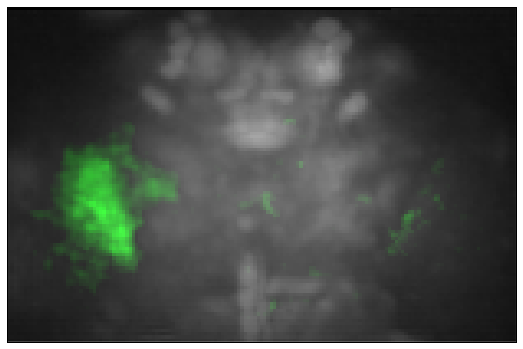

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:17: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:18: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


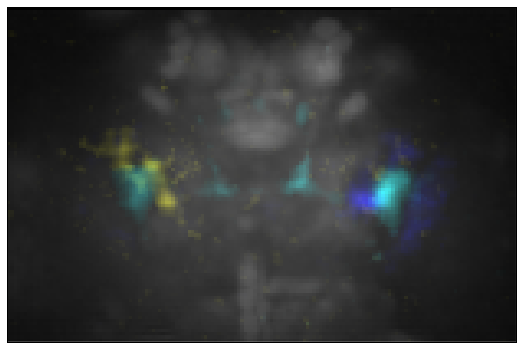

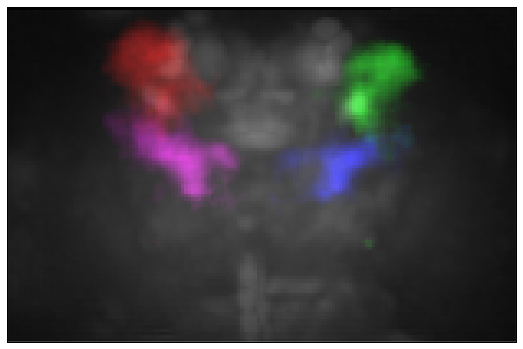

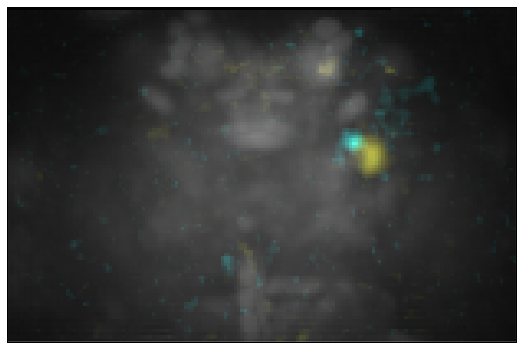

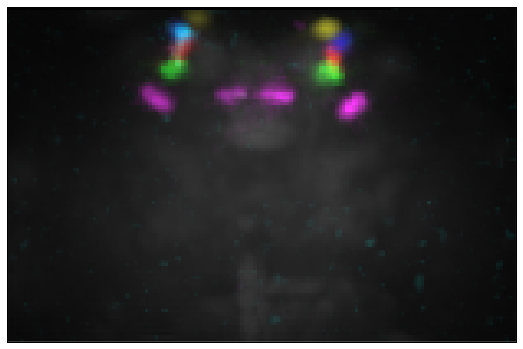

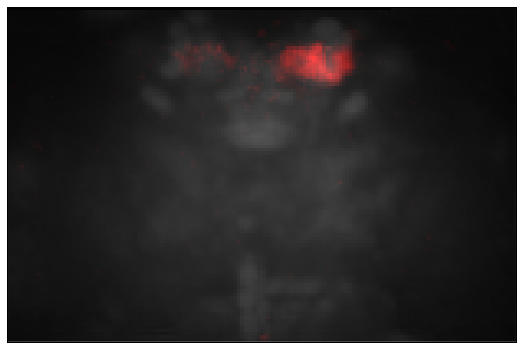

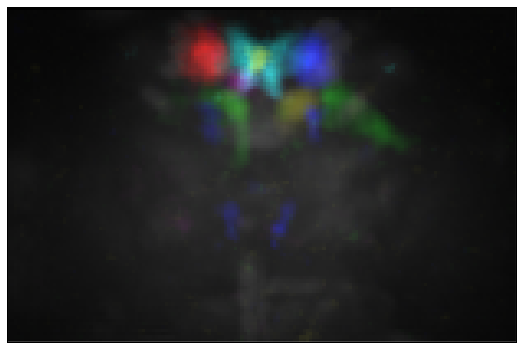

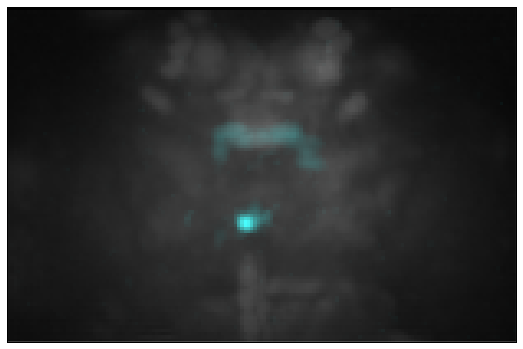

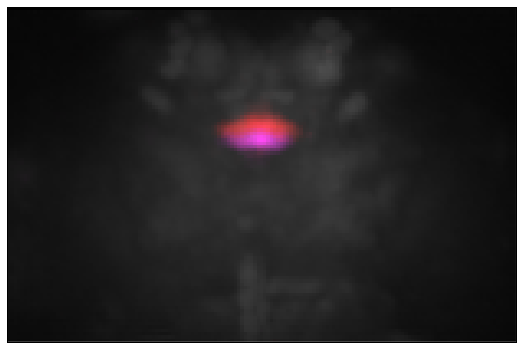

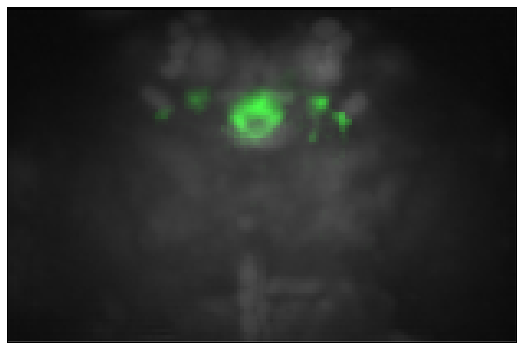

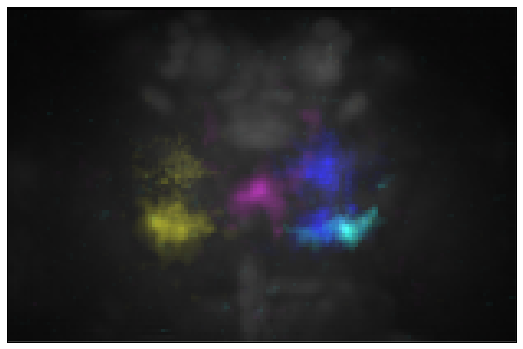

NameError: name 'Timeb' is not defined

In [350]:
pylab.rcParams['figure.figsize'] = (12, 6)
c=1

for i in range(len(Sets)):
    
    Final_map2=np.zeros([S[0],S[1],3]) 
    Fmaps2=np.zeros([S[0],S[1],3]) 
    Final_map3=np.zeros([S[0],S[1],5,3]) 
    Fmaps3=np.zeros([S[0],S[1],5,3])     
     
    if type(Sets[i])==list:
        for j in np.array(Sets[i]):
            C=np.zeros((S[3],3))
            C[j,:]=C1[c%6][:]
            #print(j)
            for k in range(3):           
                M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]],S[0]*S[1]*5)))
                Fmaps2[:,:,k]=0.9*np.mean(D2o[:,:,:,J[j]],2)*C[j,k]/M
                #M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]]),S[0]*S[1],5))
                #Fmaps3[:,:,:,k]=0.9*D2o[:,:,:,J[j]]*C[j,k]/M                
            Final_map2=Final_map2+Fmaps2
            #Final_map3=Final_map3+Fmaps3 
            c=c+1
                
    else:
        j=Sets[i]
        C[j,:]=C1[c%6][:]
        for k in range(3):           
            M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]],S[0]*S[1]*5)))
            Fmaps2[:,:,k]=0.8*np.mean(D2o[:,:,:,J[j]],2)*C[j,k]/M
        Final_map2=Final_map2+Fmaps2
        c=c+1
        
    Df=np.zeros([S[0],S[1],3]) 
  
    for l in range(3):
        Df[:,:,l]=Final_map2[:,:,l]+np.mean(Dmean,2)/600
    MM=np.max(np.max(Df))

    Rotated=ndimage.rotate(Df[:,:,:]/MM,-90)
    a=plt.imshow(Rotated,cmap=my_cmap,interpolation='none')
    frame1 = plt.gca()
    frame1.axes.get_xaxis().set_visible(False)
    frame1.axes.get_yaxis().set_visible(False)

    plt.show()
                               

In [342]:
Walk=X[:,1]+X[:,2]+X[:,0]
Walk[Walk>0]=1
Walk[Walk<0]=np.nan

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:13: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


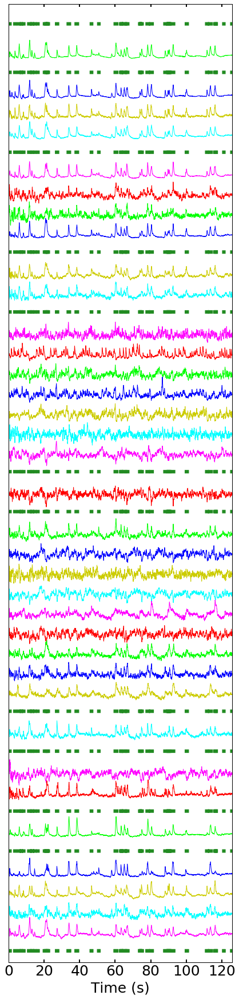

In [357]:
pylab.rcParams['figure.figsize'] = (7, 30)
h=7
l=0
c=1
plt.plot(Time_fluoICA,(Walk)+10,linewidth=6,color='forestgreen')

for i in range(len(Sets)):     
     
    if type(Sets[i])==list:
        for j in np.array(Sets[i]):
            C=np.zeros((S[3],3))
            C[j,:]=C1[c%6][:]
            plt.plot(Time_fluoICA,(DTo[:,J[j]]/np.sqrt(np.var(DTo[:,J[j]]))-h*l-h*i),color=C[j,:])
            l=l+1
            c=c+1
                
    else:
        j=Sets[i]
        C[j,:]=C1[c%6][:]
        plt.plot(Time_fluoICA,(DTo[:,J[j]]/np.sqrt(np.var(DTo[:,J[j]]))-h*l-h*i),color=C[j,:])
        l=l+1
        c=c+1
    plt.plot(Time_fluoICA,(Walk)-h*i-h*l,linewidth=6,color='forestgreen')
        
plt.plot(Time_fluoICA,(Walk)-h*i-h*l,linewidth=6,color='forestgreen')

plt.xlim([np.min(Time_fluoICA),np.max(Time_fluoICA)])
plt.ylim([-h*i-h*l+7-10,18])
frame1 = plt.gca()
frame1.axes.get_yaxis().set_visible(False)
frame1.axes.set_xlabel('Time (s)')
frame1.xaxis.set_tick_params(width=2,length=5)
matplotlib.rcParams.update({'font.size': 25})
plt.savefig('/media/DataPaper/100142/100142imagegraph.svg')
plt.show()

In [331]:
X.shape

(12436, 3)

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:39: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:40: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


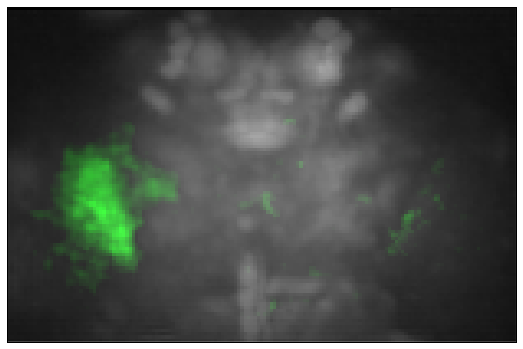

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:17: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:18: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


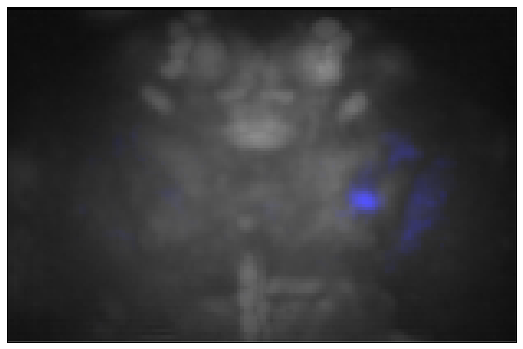

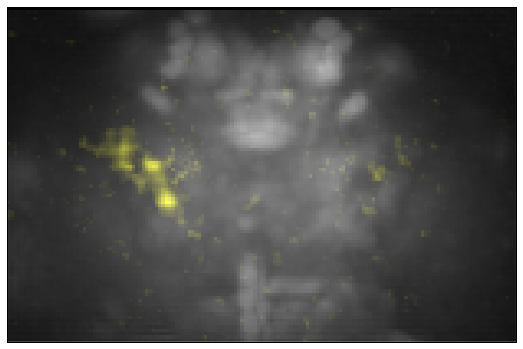

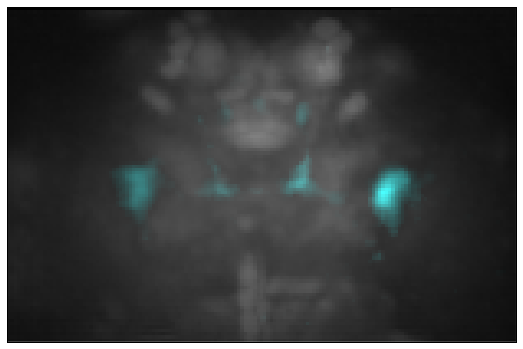

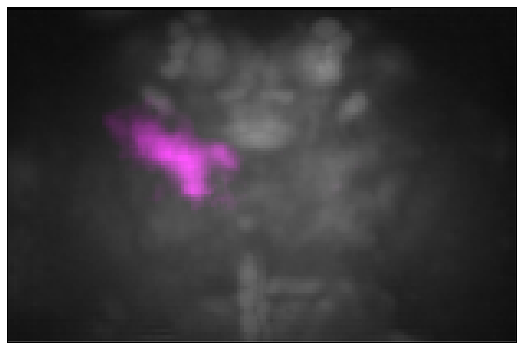

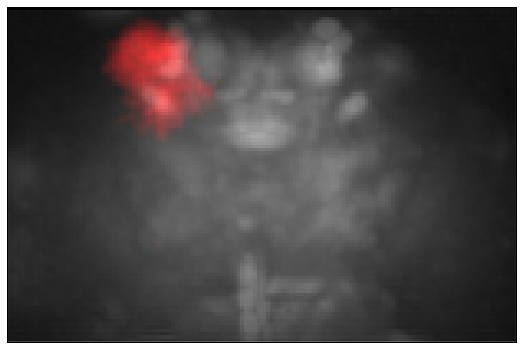

...

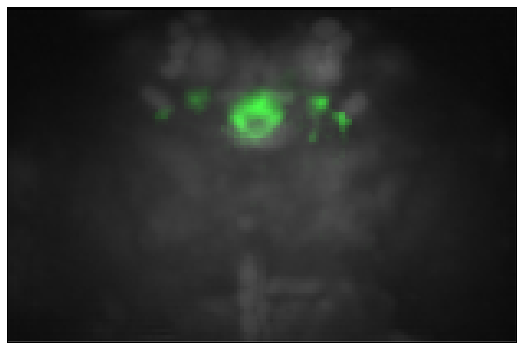

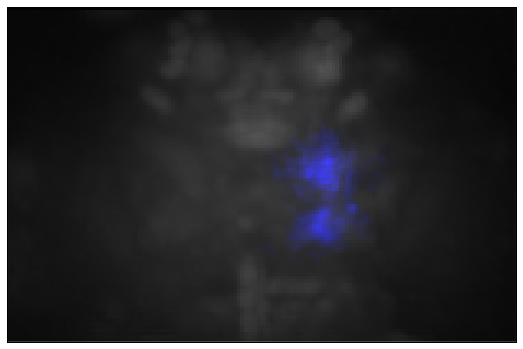

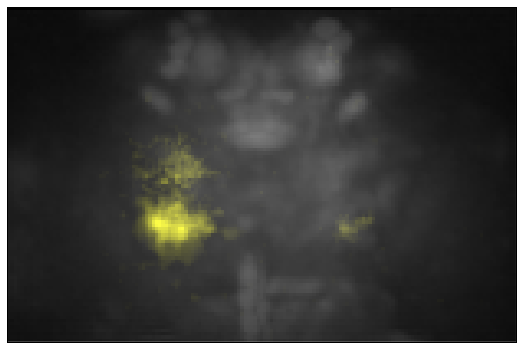

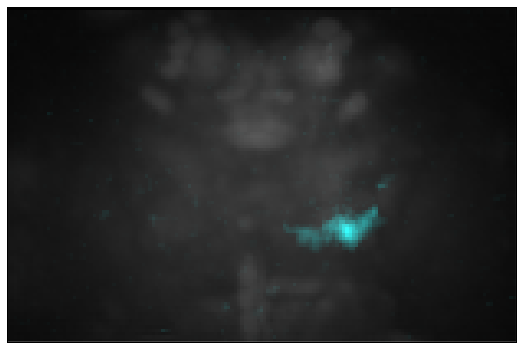

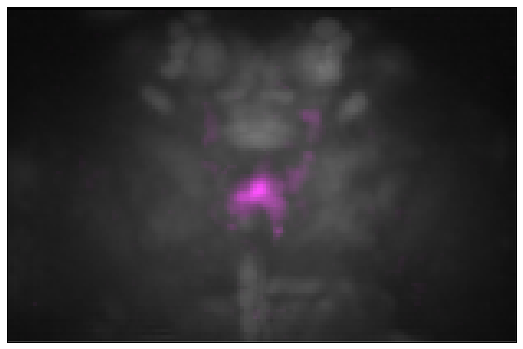

In [355]:
pylab.rcParams['figure.figsize'] = (12, 6)
c=1

for i in range(len(Sets)):
    
    Final_map2=np.zeros([S[0],S[1],3]) 
    Fmaps2=np.zeros([S[0],S[1],3]) 
    Final_map3=np.zeros([S[0],S[1],5,3]) 
    Fmaps3=np.zeros([S[0],S[1],5,3])     
     
    if type(Sets[i])==list:
        for j in np.array(Sets[i]):
            C=np.zeros((S[3],3))
            C[j,:]=C1[c%6][:]
            #print(j)
            for k in range(3):           
                M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]],S[0]*S[1]*5)))
                Fmaps2[:,:,k]=0.9*np.mean(D2o[:,:,:,J[j]],2)*C[j,k]/M
                #M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]]),S[0]*S[1],5))
                #Fmaps3[:,:,:,k]=0.9*D2o[:,:,:,J[j]]*C[j,k]/M                
            Final_map2=Final_map2+Fmaps2
            #Final_map3=Final_map3+Fmaps3 
            c=c+1
            Df=np.zeros([S[0],S[1],3]) 
            for l in range(3):
                Df[:,:,l]=Fmaps2[:,:,l]+np.mean(Dmean,2)/600
            MM=np.max(np.max(Df))

            Rotated=ndimage.rotate(Df[:,:,:]/MM,-90)
            a=plt.imshow(Rotated,cmap=my_cmap,interpolation='none')
            frame1 = plt.gca()
            frame1.axes.get_xaxis().set_visible(False)
            frame1.axes.get_yaxis().set_visible(False)
            plt.show()      
    else:
        j=Sets[i]
        C[j,:]=C1[c%6][:]
        for k in range(3):           
            M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]],S[0]*S[1]*5)))
            Fmaps2[:,:,k]=0.8*np.mean(D2o[:,:,:,J[j]],2)*C[j,k]/M
        Final_map2=Final_map2+Fmaps2
        c=c+1
        Df=np.zeros([S[0],S[1],3]) 
        for l in range(3):
            Df[:,:,l]=Final_map2[:,:,l]+np.mean(Dmean,2)/600
        MM=np.max(np.max(Df))

        Rotated=ndimage.rotate(Df[:,:,:]/MM,-90)
        a=plt.imshow(Rotated,cmap=my_cmap,interpolation='none')
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)
        plt.show()
                

# Put onsets of walk together

(-1, 0)

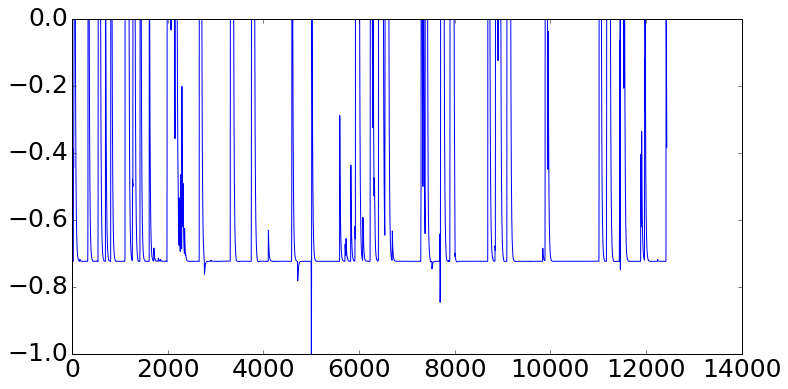

In [405]:
Walk3=X[:,1]+X[:,2]+X[:,0]
plt.plot(Walk3)
plt.ylim(-1,0)

In [406]:
Walk3[Walk3>-0.6]=1
Walk3[Walk3<-0.6]=0

In [425]:
Ion=[]
for i in range(25,(Time_fluoICA.shape[0]-25)):
    if (not Walk3[range(i-20,i)].any()) and Walk3[range(i,i+20)].all():
        Ion.append(i)

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:24: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:12: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


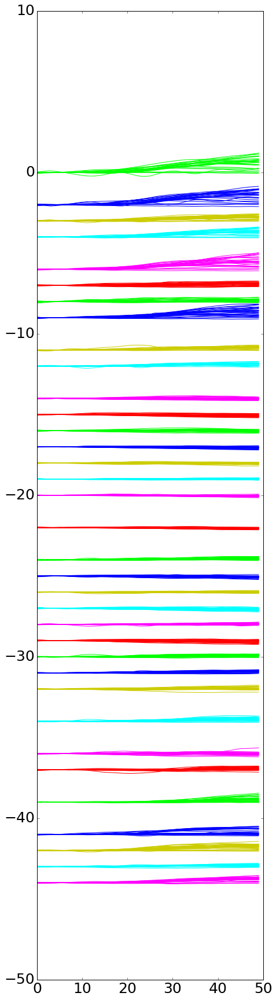

In [435]:
pylab.rcParams['figure.figsize'] = (7, 30)
c=1
l=0
m=0
for i in range(len(Sets)):   
     
    if type(Sets[i])==list:
        for j in np.array(Sets[i]):
            C=np.zeros((S[3],3))
            C[j,:]=C1[c%6][:]
            for k in range(len(Ion)):
                Ts=DTo[range(Ion[k]-25,Ion[k]+25),J[j]]
                Tsm=Ts-np.mean(Ts[range(10)])
                #plt.plot(Time_fluoICA,(DTo[:,J[j]]/np.sqrt(np.var(DTo[:,J[j]]))-h*l-h*i),color=C[j,:])
                plt.plot((-l-m+Tsm),color=C[j,:])
            c=c+1
            l=l+1
        m=m+1
                  
    else:
        j=Sets[i]
        C[j,:]=C1[c%6][:]
        for k in range(len(Ion)):
            Ts=DTo[range(Ion[k]-25,Ion[k]+25),J[j]]
            Tsm=Ts-np.mean(Ts[range(10)])
                #plt.plot(Time_fluoICA,(DTo[:,J[j]]/np.sqrt(np.var(DTo[:,J[j]]))-h*l-h*i),color=C[j,:])
            plt.plot((-l-m+Tsm),color=C[j,:])
        l=l+1
        c=c+1
        m=m+1
        

  
plt.show()

